# ChrisCo Store Data Visualisation
This notebook will explore all the customer trends across all the stores. The objective is analyse the performance, patterns and identify insights that are based on the daily customer, staff, store size, marketing and overhead costs.

In [1]:
!pip install hvplot

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 161.9/161.9 kB 4.0 MB/s eta 0:00:00


In [2]:
# Import the relevant libraries
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

import hvplot.pandas
import holoviews as hv

In [3]:
#Load datasets
StoreDailyCustomers = pd.read_csv('https://tinyurl.com/ChrisCoDV/001173097/StoreDailyCustomers.csv', index_col=0)
StoreDailyCustomers.index = pd.to_datetime(StoreDailyCustomers.index)

StoreMarketing = pd.read_csv('https://tinyurl.com/ChrisCoDV/001173097/StoreMarketing.csv', index_col=0)
StoreOverheads = pd.read_csv('https://tinyurl.com/ChrisCoDV/001173097/StoreOverheads.csv', index_col=0)
StoreSize = pd.read_csv('https://tinyurl.com/ChrisCoDV/001173097/StoreSize.csv', index_col=0)
StoreStaff = pd.read_csv('https://tinyurl.com/ChrisCoDV/001173097/StoreStaff.csv', index_col=0)

In [4]:
# Create summary dataframe with sum of total customers per store
summary_data = pd.DataFrame()
summary_data['Total Customers'] = StoreDailyCustomers.sum()

# Join the datasets
summary_data = summary_data.join(StoreMarketing)
summary_data = summary_data.join(StoreOverheads)
summary_data = summary_data.join(StoreSize)
summary_data = summary_data.join(StoreStaff)

# Rename columns for easier use
summary_data.rename(columns={
    'Marketing (£)': 'Marketing', 'Overheads (£)': 'Overheads', 'Size (msq)': 'Size'
}, inplace=True)

# Deriving other relevant metrics
summary_data['Customers per Staff'] = summary_data['Total Customers'] / summary_data['Staff']
summary_data['Customers per sqm'] = summary_data['Total Customers'] / summary_data['Size']

In [5]:
StoreDailyCustomers.head()

,RVP,VBO,UVL,AQZ,BCD,IIU,UJB,YQR,VPA,VKP,...,ZIG,QOU,UPM,WBY,ZCW,VVE,HWR,WWU,HOF,AIO
Date,,,,,,,,,,,,,,,,,,,,,
2023-01-01,357,499,81,0,64,66,515,75,75,75,...,68,0,445,938,72,1271,94,71,70,91
2023-01-02,398,500,61,0,47,80,458,82,88,57,...,71,0,368,1042,76,943,123,62,60,84
2023-01-03,373,419,75,0,76,76,411,87,81,55,...,66,0,460,679,85,936,93,54,60,93
2023-01-04,297,387,76,0,49,73,382,91,67,70,...,64,0,250,958,70,932,85,53,58,97
2023-01-05,361,396,75,0,68,88,426,73,73,70,...,72,0,546,780,70,789,94,59,67,89


In [6]:
StoreDailyCustomers.describe()

,RVP,VBO,UVL,AQZ,BCD,IIU,UJB,YQR,VPA,VKP,...,ZIG,QOU,UPM,WBY,ZCW,VVE,HWR,WWU,HOF,AIO
count,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,...,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000
mean,396.923288,443.698630,75.523288,33.243836,31.739726,84.000000,457.898630,81.487671,77.942466,68.482192,...,70.997260,20.186301,462.520548,862.958904,74.517808,993.961644,93.575342,59.476712,64.479452,46.893151
std,72.655628,42.237842,7.218157,55.822651,32.623151,13.492977,53.344857,6.185590,8.595263,7.532190,...,4.702407,49.961945,84.139685,166.492339,4.895371,141.394696,10.027870,11.145522,6.550542,47.597755
min,162.000000,350.000000,52.000000,0.000000,0.000000,40.000000,300.000000,65.000000,50.000000,47.000000,...,59.000000,0.000000,250.000000,243.000000,60.000000,656.000000,61.000000,31.000000,47.000000,0.000000
25%,348.000000,410.000000,71.000000,0.000000,0.000000,75.000000,420.000000,77.000000,72.000000,63.000000,...,68.000000,0.000000,404.000000,755.000000,71.000000,896.000000,88.000000,52.000000,60.000000,0.000000
50%,394.000000,444.000000,75.000000,0.000000,0.000000,84.000000,455.000000,81.000000,78.000000,69.000000,...,71.000000,0.000000,464.000000,870.000000,75.000000,1002.000000,93.000000,60.000000,65.000000,0.000000
75%,445.000000,479.000000,80.000000,56.000000,63.000000,93.000000,498.000000,86.000000,84.000000,73.000000,...,74.000000,0.000000,523.000000,977.000000,78.000000,1082.000000,100.000000,67.000000,69.000000,94.000000
max,591.000000,568.000000,99.000000,272.000000,87.000000,117.000000,608.000000,102.000000,105.000000,89.000000,...,86.000000,250.000000,705.000000,1361.000000,88.000000,1533.000000,129.000000,88.000000,82.000000,115.000000


In [7]:
summary_data.head()

,Total Customers,Marketing,Overheads,Size,Staff,Customers per Staff,Customers per sqm
RVP,144877,13000,94000,1040,9,16097.444444,139.304808
VBO,161950,15000,57000,2714,17,9526.470588,59.672071
UVL,27566,3000,26000,317,3,9188.666667,86.958991
AQZ,12134,2000,35000,77,1,12134.000000,157.584416
BCD,11585,2000,45000,165,2,5792.500000,70.212121


In [8]:
summary_data.describe()

,Total Customers,Marketing,Overheads,Size,Staff,Customers per Staff,Customers per sqm
count,40.000000,40.000000,40.000000,40.000000,40.000000,40.000000,40.000000
mean,80644.625000,8525.000000,58200.000000,1093.450000,10.175000,9246.070455,92.370048
std,103297.359837,10900.452825,26304.138311,1548.423664,15.231357,4146.006773,36.784397
min,4490.000000,1000.000000,12000.000000,51.000000,1.000000,4147.000000,47.014308
25%,23247.000000,2750.000000,34500.000000,212.750000,2.000000,5860.937500,59.655356
50%,28007.500000,3000.000000,59500.000000,347.000000,4.000000,8051.181818,86.583891
75%,126952.500000,12250.000000,77250.000000,1107.000000,9.250000,12214.375000,121.783094
max,369123.000000,43000.000000,100000.000000,5656.000000,67.000000,17981.700000,169.061728


# Bar Chart

### Basic Bar Chart

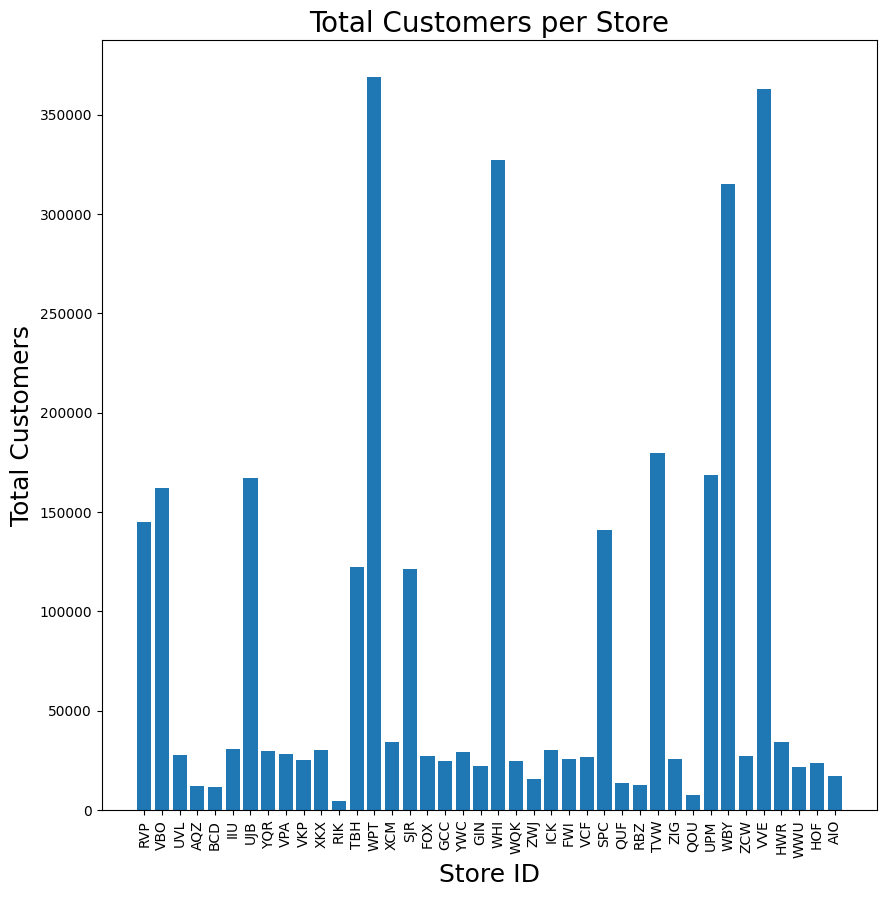

In [9]:
# Plot a basic bar chart for total customers per store
plt.figure(figsize=(10, 10))
x_pos = np.arange(len(StoreDailyCustomers.columns))
plt.bar(x_pos, StoreDailyCustomers.sum(), align='center')
plt.xticks(x_pos, StoreDailyCustomers.columns, rotation=90)
plt.xlabel('Store ID', fontsize=18)
plt.ylabel('Total Customers', fontsize=18)
plt.title('Total Customers per Store', fontsize=20)
plt.show()

### Sorted Bar Chart

A bar chart that ranks all the stores by total customer count. This helps to segment the total customers per store into high, medium, and low volume stores.

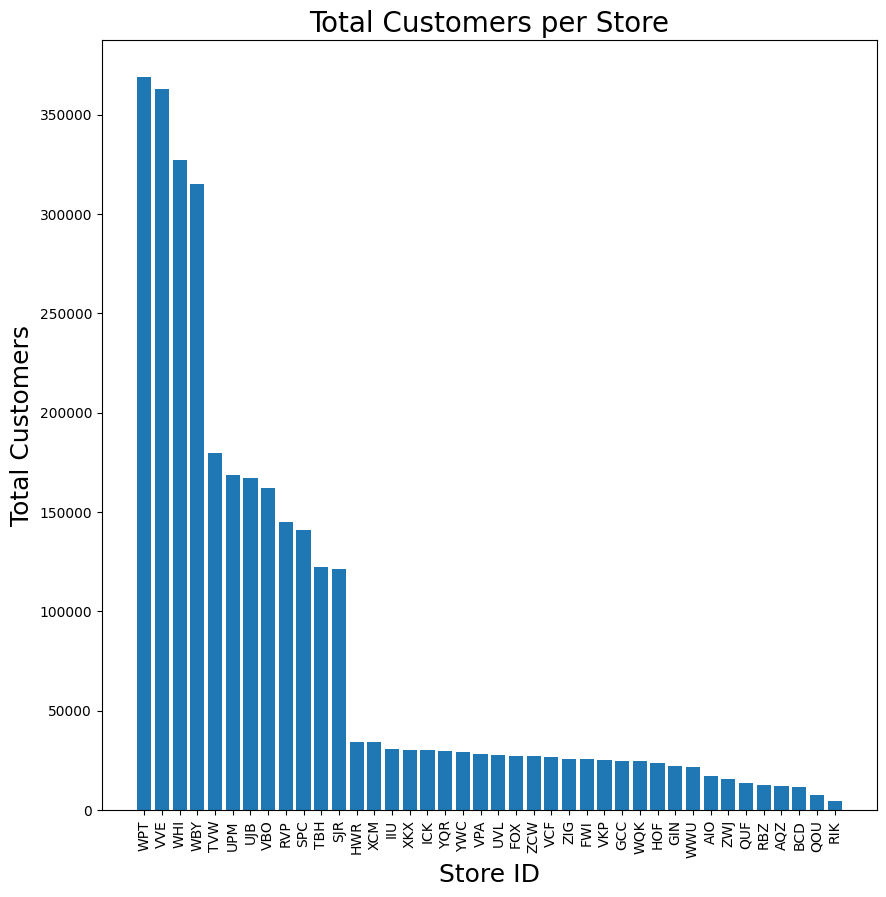

In [10]:
# sort the data according to the sum of each column
sorted_data = StoreDailyCustomers.reindex(StoreDailyCustomers.sum().sort_values(ascending=False).index, axis=1)

plt.figure(figsize=(10, 10))
x_pos = np.arange(len(sorted_data.columns))
plt.bar(x_pos, sorted_data.sum(), align='center')
plt.xticks(x_pos, sorted_data.columns, rotation=90)
plt.xlabel('Store ID', fontsize=18)
plt.ylabel('Total Customers', fontsize=18)
plt.title('Total Customers per Store', fontsize=20)
plt.show()

### Sorted Coloured Coded Bar Chart

Segmenting the bar chart for better visualisation to gain deeper insights.

High stores: ['WPT', 'VVE', 'WHI', 'WBY']
Medium stores: ['TVW', 'UPM', 'UJB', 'VBO', 'RVP', 'SPC', 'TBH', 'SJR']
Low stores: ['HWR', 'XCM', 'IIU', 'XKX', 'ICK', 'YQR', 'YWC', 'VPA', 'UVL', 'FOX', 'ZCW', 'VCF', 'ZIG', 'FWI', 'VKP', 'GCC', 'WQK', 'HOF', 'GIN', 'WWU', 'AIO', 'ZWJ', 'QUF', 'RBZ', 'AQZ', 'BCD', 'QOU', 'RIK']


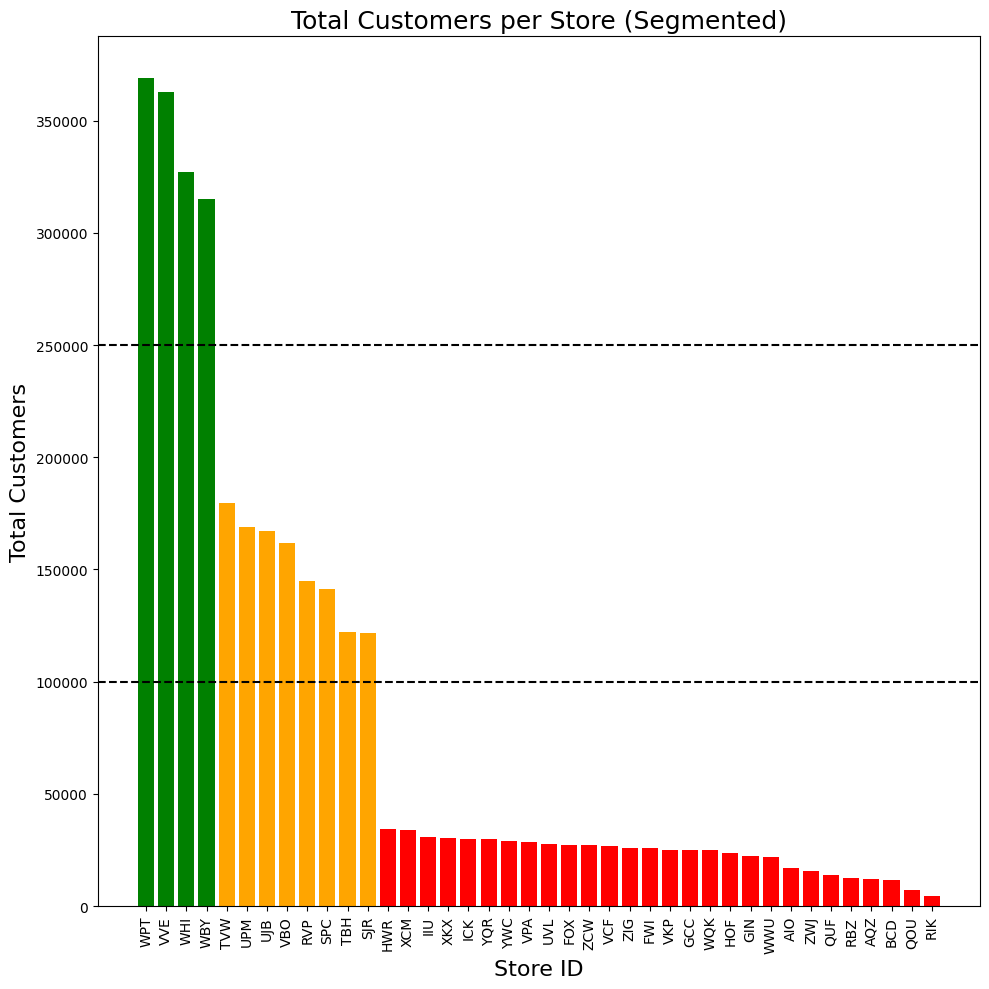

In [11]:
# Sort data by total customers per store
sorted_data = StoreDailyCustomers.reindex(StoreDailyCustomers.sum().sort_values(ascending=False).index, axis=1)
totals = sorted_data.sum()

# Define segmentation
segment_limits = {
    0: 'Low',
    100_000: 'Medium',
    250_000: 'High'
}

# Segment the stores
segments = {}
limits = list(segment_limits.keys())
for i in range(len(limits)):
    if i < len(limits) - 1:
        included = (limits[i] <= totals) & (totals < limits[i + 1])
    else:
        included = (limits[i] <= totals)
    segment_name = segment_limits[limits[i]]
    segment_columns = sorted_data.columns[included]
    segments[segment_name] = list(totals.index[included])

# Print store IDs per segment
for segment_name in reversed(segments):
    print(f'{segment_name} stores: {segments[segment_name]}')

segment_colours = {
    'Low': 'red',
    'Medium': 'orange',
    'High': 'green'
}

# Assign colours to each store
colours = []
for store in totals.index:
    for segment_name in segments:
        if store in segments[segment_name]:
            colours.append(segment_colours[segment_name])
            break

# Plot
plt.figure(figsize=(10, 10))
x_pos = np.arange(len(sorted_data.columns))
plt.bar(x_pos, totals[sorted_data.columns], color=colours, align='center')
plt.xticks(x_pos, sorted_data.columns, rotation=90)
plt.xlabel('Store ID', fontsize=16)
plt.ylabel('Total Customers', fontsize=16)
plt.title('Total Customers per Store (Segmented)', fontsize=18)
# Add horizontal dashed lines at segmentation boundaries
plt.axhline(y=100_000, color='black', linestyle='--', linewidth=1.5, label='100,000 (Medium Threshold)')
plt.axhline(y=250_000, color='black', linestyle='--', linewidth=1.5, label='250,000 (High Threshold)')
plt.tight_layout()
plt.show()

### High, Medium, Low Bar Charts For Stores

Segmenting the chart above into different

High: ['WPT', 'VVE', 'WHI', 'WBY']
Medium: ['TVW', 'UPM', 'UJB', 'VBO', 'RVP', 'SPC', 'TBH', 'SJR']
Low: ['HWR', 'XCM', 'IIU', 'XKX', 'ICK', 'YQR', 'YWC', 'VPA', 'UVL', 'FOX', 'ZCW', 'VCF', 'ZIG', 'FWI', 'VKP', 'GCC', 'WQK', 'HOF', 'GIN', 'WWU', 'AIO', 'ZWJ', 'QUF', 'RBZ', 'AQZ', 'BCD', 'QOU', 'RIK']


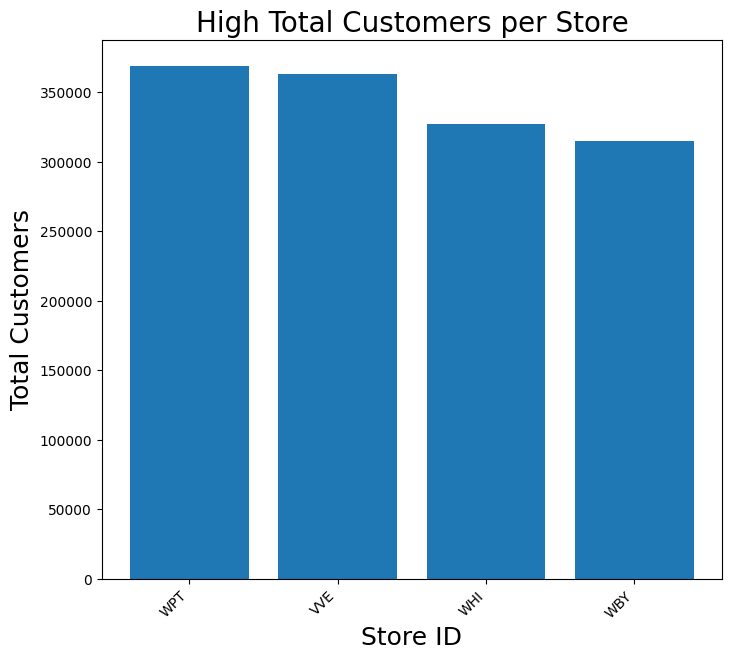

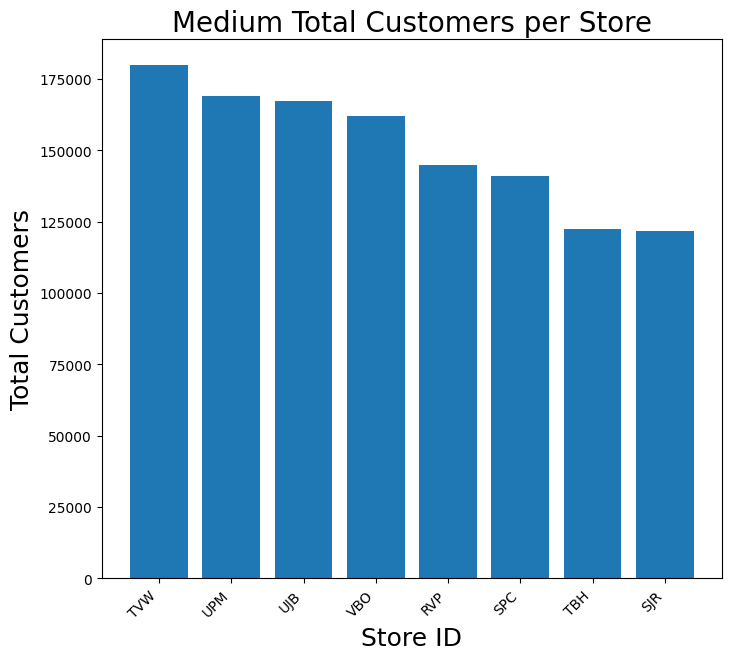

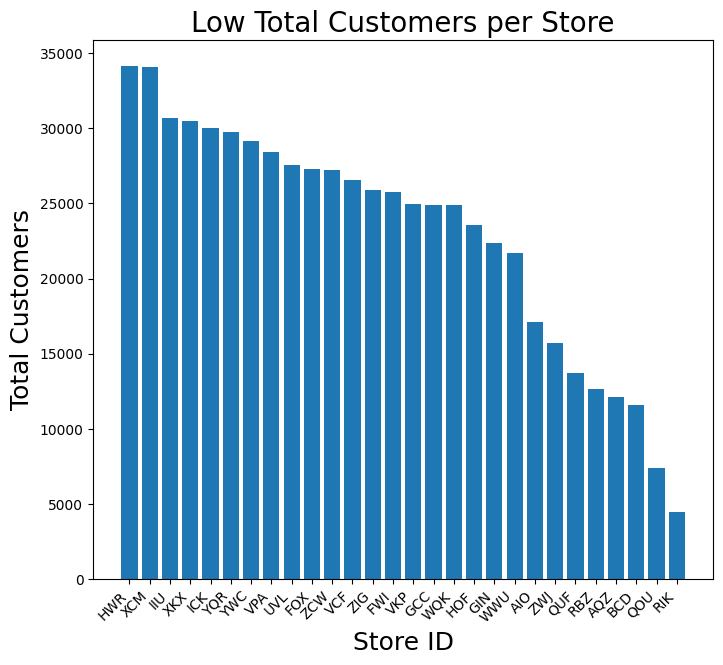

In [12]:
# Segment definition
segment_limits = {
    0: 'Low',
    100_000: 'Medium',
    250_000: 'High',
}

segments = {}
limits = list(segment_limits.keys())

# Segment assignment
for i in range(len(limits)):
    if i < len(limits) - 1:
        included = (limits[i] <= sorted_data.sum()) & (sorted_data.sum() < limits[i + 1])
    else:
        included = (limits[i] <= sorted_data.sum())
    segment_name = segment_limits[limits[i]]
    segment_columns = sorted_data.columns[included]
    segments[segment_name] = list(segment_columns)

# Print segments
for segment_name in reversed(segments):
    print(f'{segment_name}: {segments[segment_name]}')

# Plot each segment
for segment_name in reversed(segments):
    selected = segments[segment_name]
    plt.figure(figsize=(8, 7))
    x_pos = np.arange(len(sorted_data[selected].columns))
    plt.bar(x_pos, sorted_data[selected].sum(), align='center')
    plt.xticks(x_pos, sorted_data[selected].columns, rotation=45, ha='right')
    plt.xlabel('Store ID', fontsize=18)
    plt.ylabel('Total Customers', fontsize=18)
    plt.title(segment_name + ' Total Customers per Store', fontsize=20)
    plt.show()

# Time Series Plots (Line Plots)

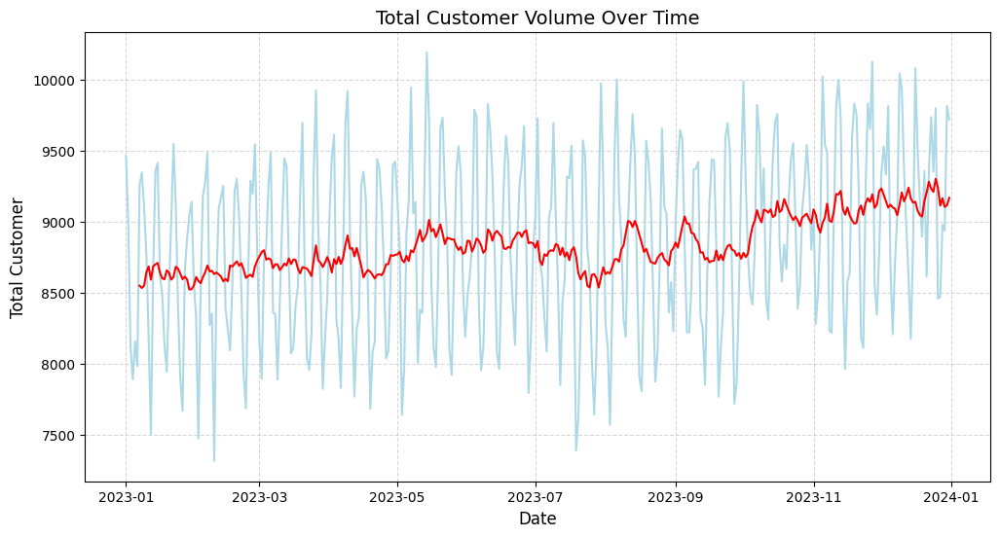

In [13]:
# Sum of the total customer volume per day of all stores
total_daily_visits = StoreDailyCustomers.sum(axis=1)

# Plotting the sum daily customer count for each store
plt.figure(figsize=(12, 6))
plt.plot(total_daily_visits, color='lightblue', linewidth=1.5)

# Adding the labels and titles
plt.title('Total Customer Volume Over Time', fontsize=14)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Total Customer', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.5)

plt.plot(total_daily_visits.rolling(window=7).mean(), color='red', label='7-Day Avg')

plt.show()

### Basic Line Plot

This helps to see the customer traffic for each store throughout the year.

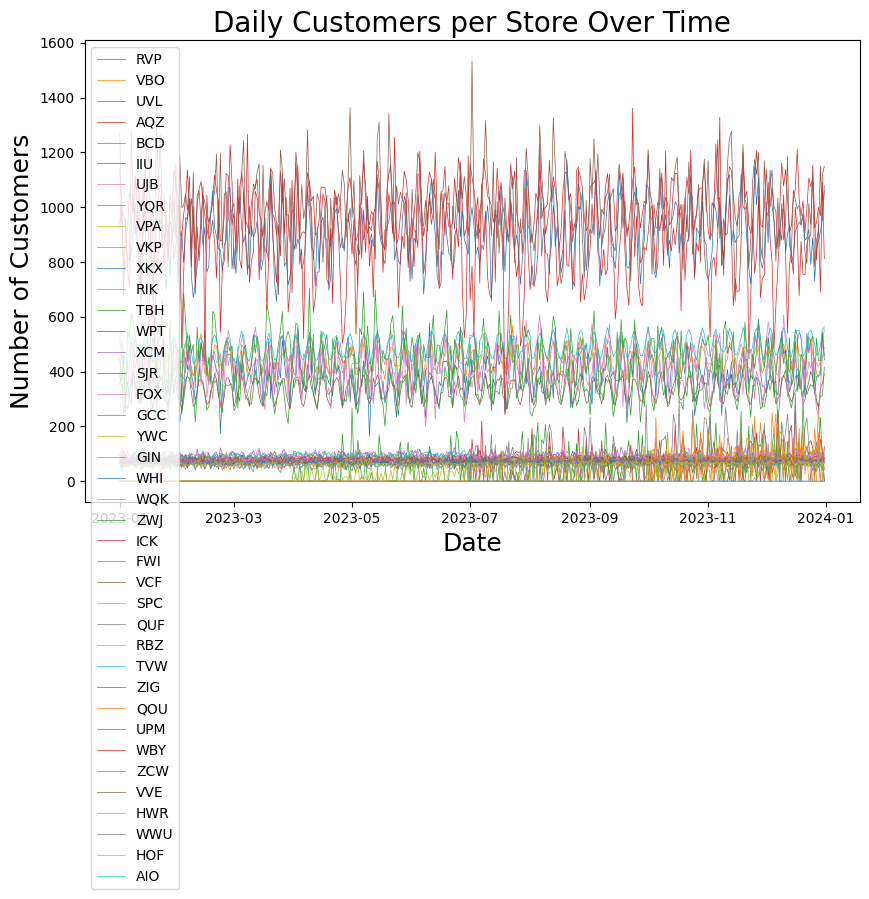

In [14]:
# Line Plot of Daily Customers per Store
plt.figure(figsize=(10, 6))

# Plotting the daily customer count for each store
plt.plot(StoreDailyCustomers, linewidth=0.5)

# Adding the labels and titles
plt.xlabel('Date', fontsize=18)
plt.ylabel('Number of Customers', fontsize=18)
plt.title('Daily Customers per Store Over Time', fontsize=20)

# Adding the legend
plt.legend(StoreDailyCustomers.columns, loc=2)
plt.show()

Daily Customer Trends for all High Volume Stores.

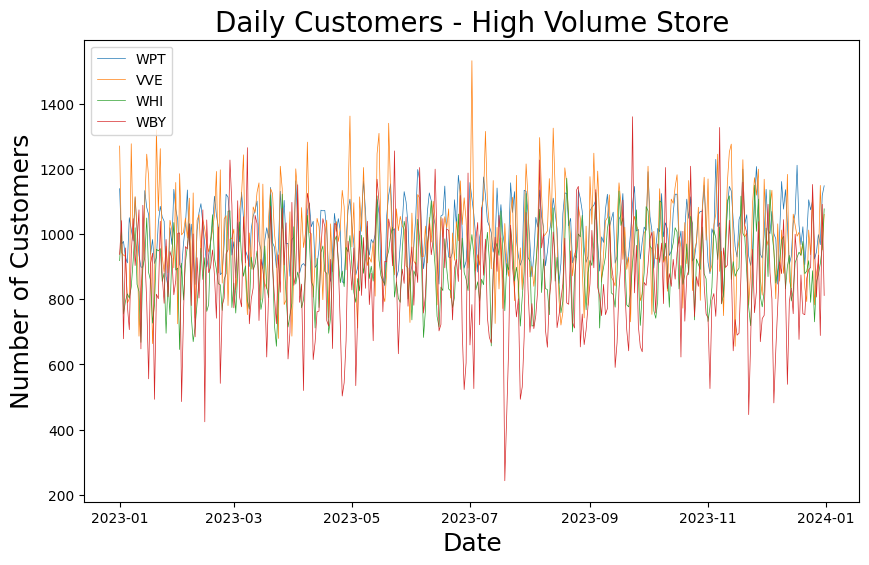

In [15]:
# selected the high-volume stores
selected = ['WPT', 'VVE', 'WHI', 'WBY']

# Plotting the daily customer count for each store
plt.figure(figsize=(10, 6))
plt.plot(StoreDailyCustomers[selected], linewidth=0.5)

# Adding the labels and titles
plt.xlabel('Date', fontsize=18)
plt.ylabel('Number of Customers', fontsize=18)
plt.title('Daily Customers - High Volume Store', fontsize=20)

# Adding the legend
plt.legend(selected, loc=2)
plt.show()


Daily vs Weekly average customers for high volume stores of the four top stores.

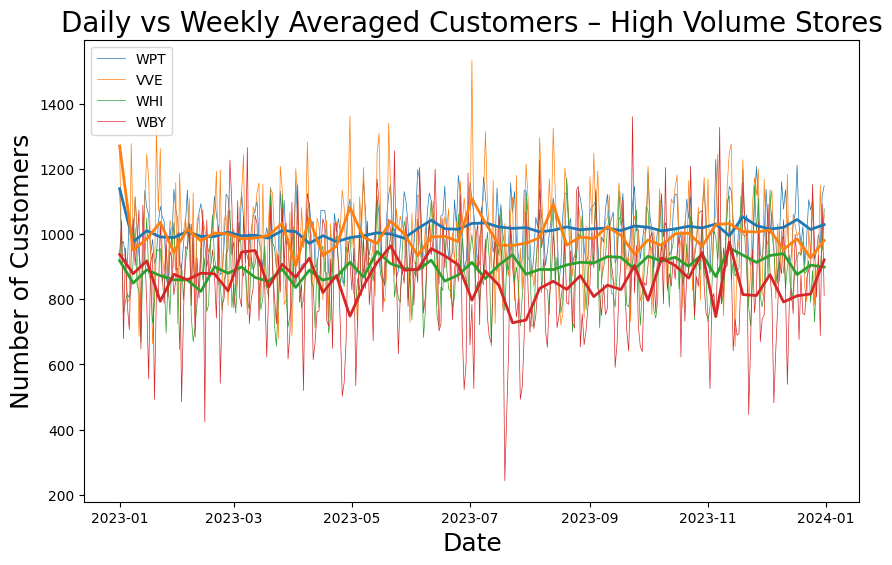

In [16]:
# Setting the frequency to weekly to calculate the weekly average
sample_rate = 'W'
averaged_data = StoreDailyCustomers.resample(sample_rate).mean()

# selected the high-volume stores
selected = ['WPT', 'VVE', 'WHI', 'WBY']

# Plotting the daily customer count for each store
plt.figure(figsize=(10, 6))
plt.plot(StoreDailyCustomers[selected], linewidth=0.5)
plt.gca().set_prop_cycle(None)
plt.plot(averaged_data[selected], linewidth=2)

# Adding the labels and titles
plt.xlabel('Date', fontsize=18)
plt.ylabel('Number of Customers', fontsize=18)
plt.title('Daily vs Weekly Averaged Customers – High Volume Stores', fontsize=20)

# Adding the legend
plt.legend(selected, loc=2)
plt.show()

Daily Customers with 7-day rolling average for all high performing stores.

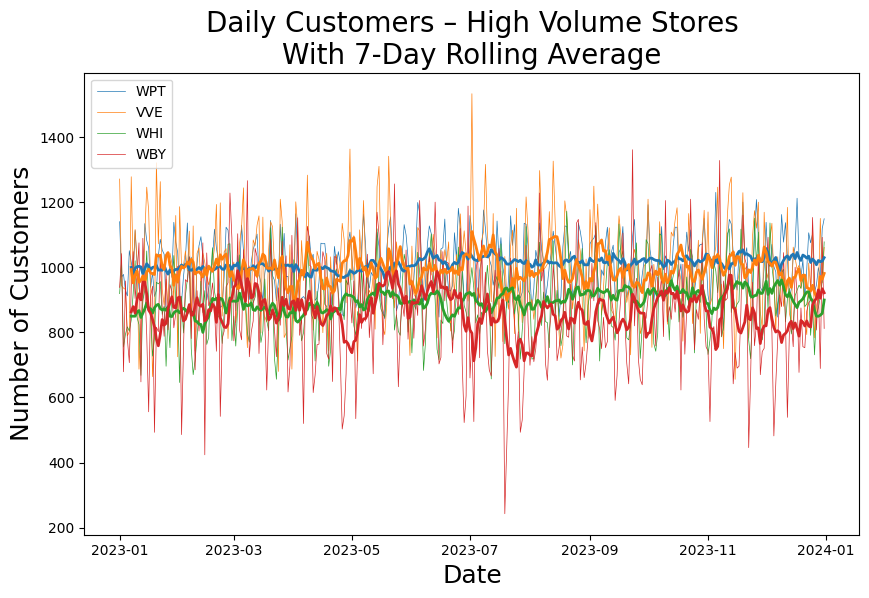

In [17]:
# Setting the rolling average to 7 days
period = 7
rolling_average = StoreDailyCustomers.rolling(window=period).mean()

# selected the high-volume stores
selected = ['WPT', 'VVE', 'WHI', 'WBY']

# Plotting the daily customer count for each store
plt.figure(figsize=(10, 6))
plt.plot(StoreDailyCustomers[selected], linewidth=0.5)
plt.gca().set_prop_cycle(None)
plt.plot(rolling_average[selected], linewidth=2)

# Adding the labels and titles
plt.xlabel('Date', fontsize=18)
plt.ylabel('Number of Customers', fontsize=18)
plt.title('Daily Customers – High Volume Stores\nWith 7-Day Rolling Average', fontsize=20)

# Adding the legend
plt.legend(selected, loc=2)
plt.show()

Isolating the 7-day rolling average for all high volume stores

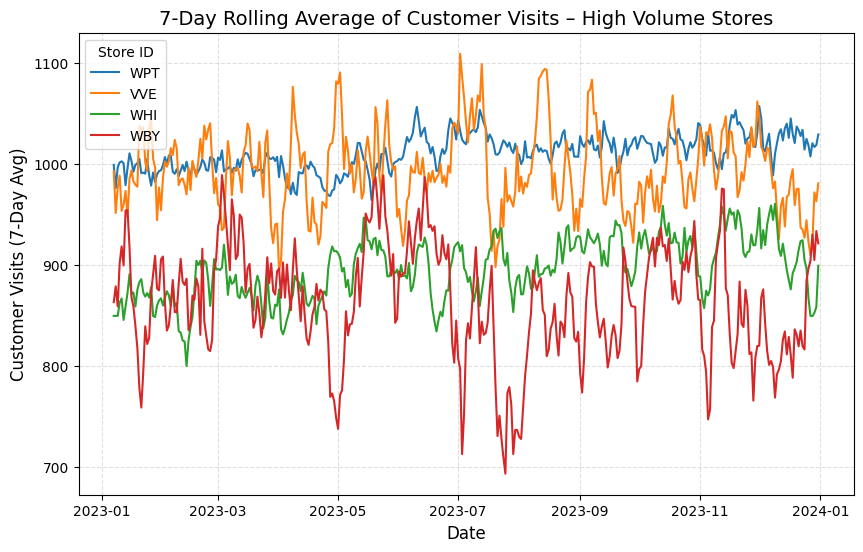

In [18]:
# Setting the rolling average to 7 days
rolling_average = StoreDailyCustomers.rolling(window=period).mean()

# selected the high-volume stores
selected = ['WPT', 'VVE', 'WHI', 'WBY']

# Plotting the daily customer count for each store
plt.figure(figsize=(10, 6))
plt.plot(rolling_average[selected], linewidth=1.5)

# Adding the labels and titles
plt.title('7-Day Rolling Average of Customer Visits – High Volume Stores', fontsize=14)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Customer Visits (7-Day Avg)', fontsize=12)

# Adding the legend
plt.legend(title='Store ID', labels=selected, loc=2)
plt.grid(True, linestyle='--', alpha=0.4)

plt.show()

Isolating the 7-day rolling average for all high volume stores with linear growth patterns

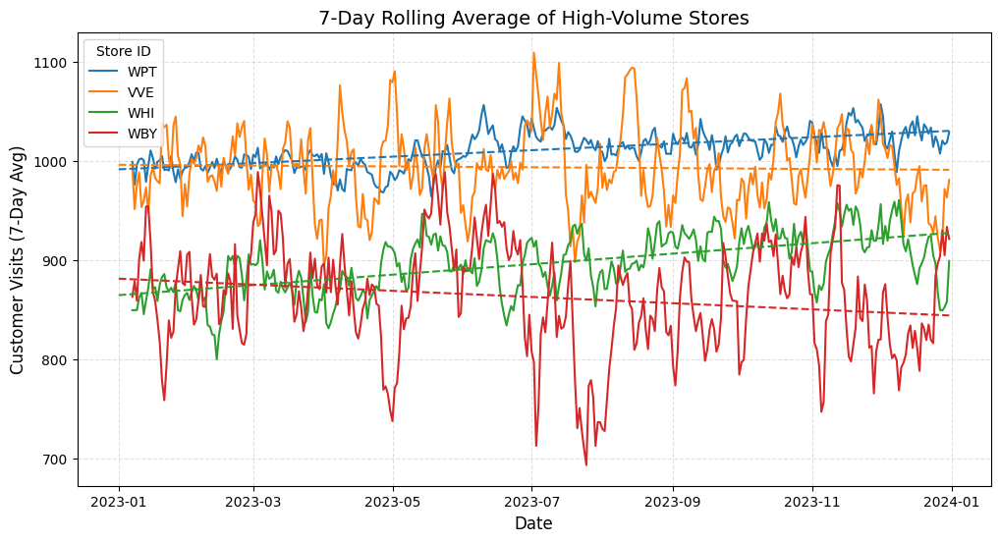

In [19]:
# Setting the rolling average to 7 days
rolling_average = StoreDailyCustomers.rolling(window=period).mean()

# selected the high-volume stores
selected = ['WPT', 'VVE', 'WHI', 'WBY']

# Plotting the daily customer count for each store
plt.figure(figsize=(12, 6))
plt.plot(rolling_average[selected], linewidth=1.5)
plt.gca().set_prop_cycle(None)

# overlay all linear trend lines for each store
for name in selected:
    x = np.arange(len(StoreDailyCustomers[name]))
    z = np.polyfit(x, StoreDailyCustomers[name], 1)
    trend = np.poly1d(z)
    plt.plot(StoreDailyCustomers.index, trend(x), linestyle='--')

# Adding the labels and titles
plt.title('7-Day Rolling Average of High-Volume Stores', fontsize=14)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Customer Visits (7-Day Avg)', fontsize=12)

# Adding the legend
plt.legend(title='Store ID', labels=selected, loc=2)
plt.grid(True, linestyle='--', alpha=0.4)

plt.show()

Daily Customer Trends for all Medium Volume Stores.

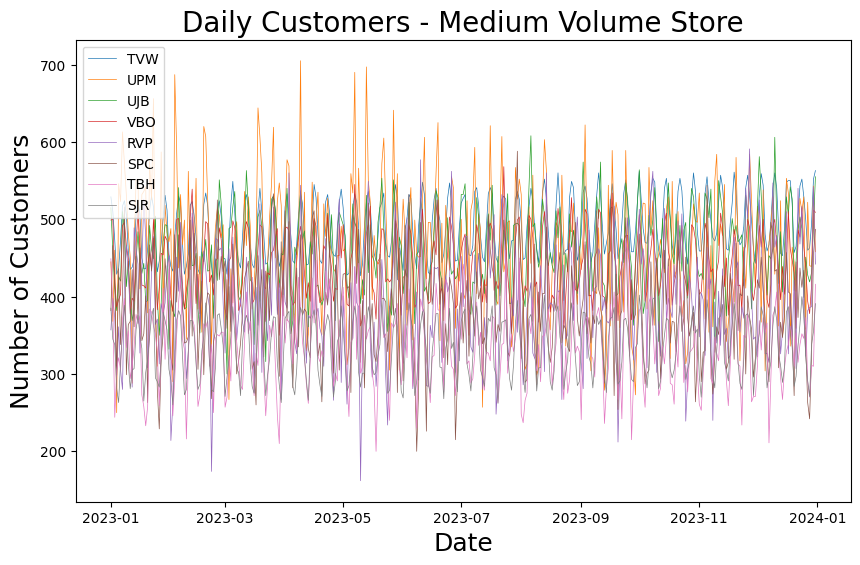

In [20]:
# selected the medium-volume stores
selected = ['TVW', 'UPM', 'UJB', 'VBO', 'RVP', 'SPC', 'TBH', 'SJR']

# Plotting the daily customer count for each store
plt.figure(figsize=(10, 6))
plt.plot(StoreDailyCustomers[selected], linewidth=0.5)

# Adding the labels and titles
plt.xlabel('Date', fontsize=18)
plt.ylabel('Number of Customers', fontsize=18)
plt.title('Daily Customers - Medium Volume Store', fontsize=20)

# Adding the legend
plt.legend(selected, loc=2)
plt.show()

Daily vs Weekly average customers for medium volume stores.

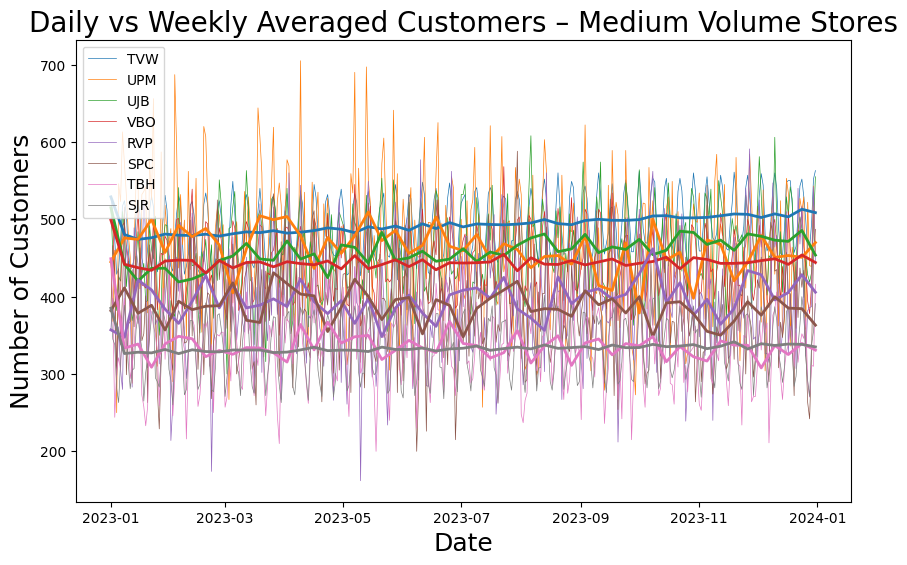

In [21]:
# Setting the frequency to weekly to calculate the weekly average
sample_rate = 'W'
averaged_data = StoreDailyCustomers.resample(sample_rate).mean()

# selected the medium-volume stores
selected = ['TVW', 'UPM', 'UJB', 'VBO', 'RVP', 'SPC', 'TBH', 'SJR']

# Plotting the daily customer count for each store
plt.figure(figsize=(10, 6))
plt.plot(StoreDailyCustomers[selected], linewidth=0.5)
plt.gca().set_prop_cycle(None)
plt.plot(averaged_data[selected], linewidth=2)

# Adding the labels and titles
plt.xlabel('Date', fontsize=18)
plt.ylabel('Number of Customers', fontsize=18)
plt.title('Daily vs Weekly Averaged Customers – Medium Volume Stores', fontsize=20)

# Adding the legend
plt.legend(selected, loc=2)
plt.show()

Isolating the 7-day rolling average for all medium volume stores

<ipython-input-22-bc039b2c1172>:17: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title='Store ID')


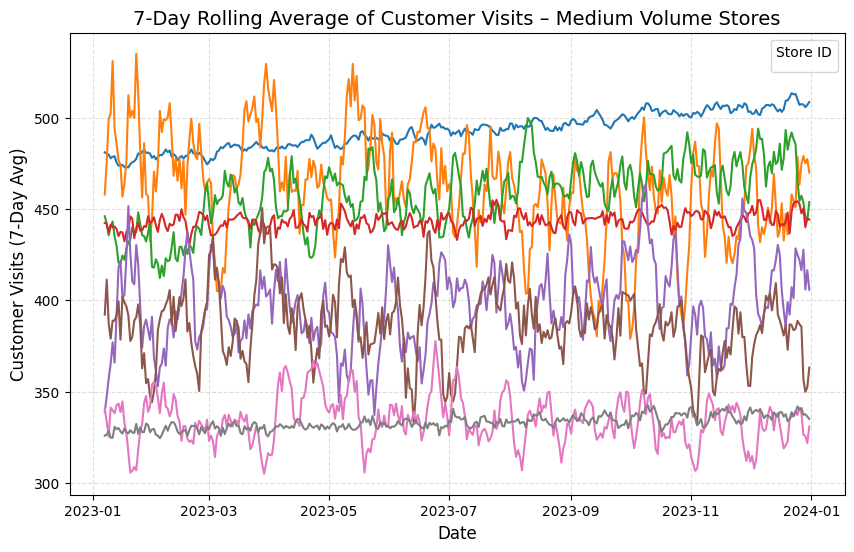

In [22]:
# Setting the rolling average to 7 days
rolling_average = StoreDailyCustomers.rolling(window=period).mean()

# selected the medium-volume stores
selected = ['TVW', 'UPM', 'UJB', 'VBO', 'RVP', 'SPC', 'TBH', 'SJR']

# Plotting the daily customer count for each store
plt.figure(figsize=(10, 6))
plt.plot(rolling_average[selected], linewidth=1.5)

# Adding the labels and titles
plt.title('7-Day Rolling Average of Customer Visits – Medium Volume Stores', fontsize=14)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Customer Visits (7-Day Avg)', fontsize=12)

# Adding the legend
plt.legend(title='Store ID')
plt.grid(True, linestyle='--', alpha=0.4)

plt.show()

Isolating the 7-day rolling average for all medium volume stores with linear growth patterns

<ipython-input-23-46cb572c8222>:25: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title='Store ID')


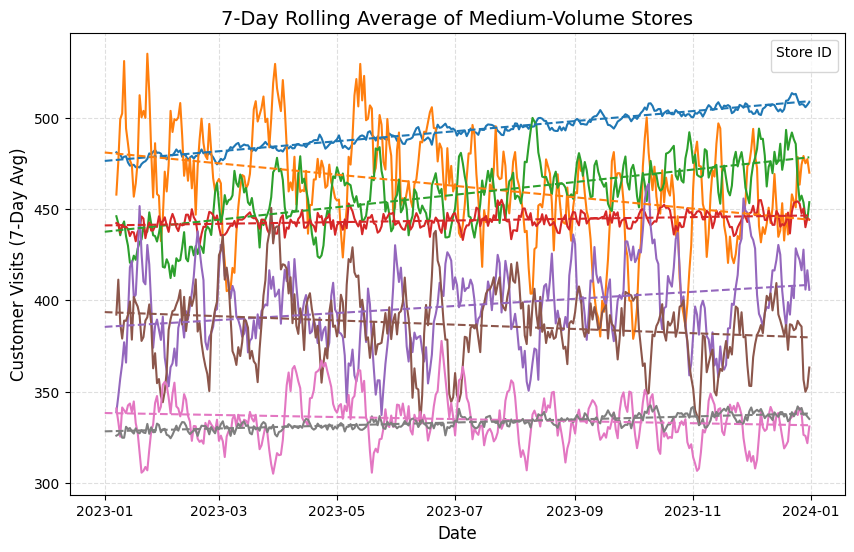

In [23]:
# Setting the rolling average to 7 days
rolling_average = StoreDailyCustomers.rolling(window=period).mean()

# selected the medium-volume stores
selected = ['TVW', 'UPM', 'UJB', 'VBO', 'RVP', 'SPC', 'TBH', 'SJR']

# Plotting the daily customer count for each store
plt.figure(figsize=(10, 6))
plt.plot(rolling_average[selected], linewidth=1.5)
plt.gca().set_prop_cycle(None)

# overlay all linear trend lines for each store
for name in selected:
    x = np.arange(len(StoreDailyCustomers[name]))
    z = np.polyfit(x, StoreDailyCustomers[name], 1)
    trend = np.poly1d(z)
    plt.plot(StoreDailyCustomers.index, trend(x), linestyle='--')

# Adding the labels and titles
plt.title('7-Day Rolling Average of Medium-Volume Stores', fontsize=14)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Customer Visits (7-Day Avg)', fontsize=12)

# Adding the legend
plt.legend(title='Store ID')
plt.grid(True, linestyle='--', alpha=0.4)

plt.show()

Daily Customer Trends for all Low Volume Stores.

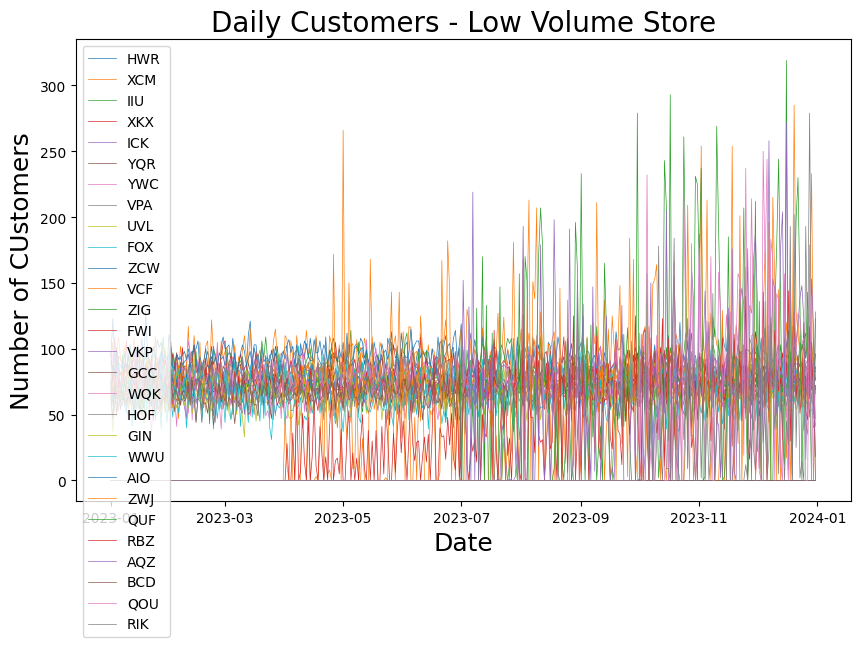

In [24]:
# selected the low-volume stores
selected = ['HWR', 'XCM', 'IIU', 'XKX', 'ICK', 'YQR', 'YWC', 'VPA', 'UVL', 'FOX', 'ZCW', 'VCF', 'ZIG', 'FWI', 'VKP', 'GCC', 'WQK', 'HOF', 'GIN', 'WWU', 'AIO', 'ZWJ', 'QUF', 'RBZ', 'AQZ', 'BCD', 'QOU', 'RIK']

# Plotting the daily customer count for each store
plt.figure(figsize=(10, 6))
plt.plot(StoreDailyCustomers[selected], linewidth=0.5)

# Adding the labels and titles
plt.xlabel('Date', fontsize=18)
plt.ylabel('Number of CUstomers', fontsize=18)
plt.title('Daily Customers - Low Volume Store', fontsize=20)

# Adding the legend
plt.legend(selected, loc=2)
plt.show()

Daily vs Weekly average customers for low volume stores.

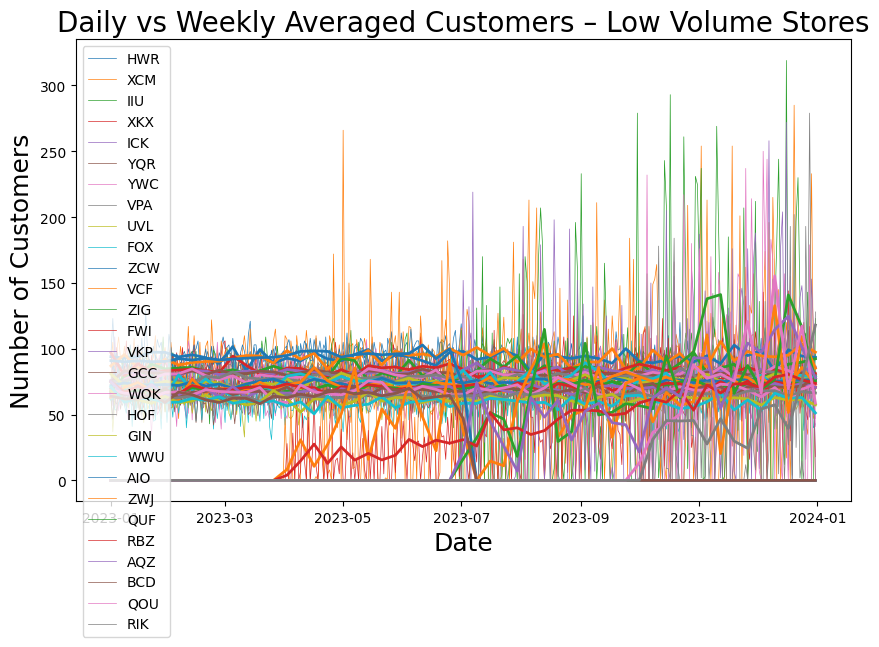

In [25]:
# Setting the frequency to weekly to calculate the weekly average
sample_rate = 'W'
averaged_data = StoreDailyCustomers.resample(sample_rate).mean()

# selected the low-volume stores
selected = ['HWR', 'XCM', 'IIU', 'XKX', 'ICK', 'YQR', 'YWC', 'VPA', 'UVL', 'FOX', 'ZCW', 'VCF', 'ZIG', 'FWI', 'VKP', 'GCC', 'WQK', 'HOF', 'GIN', 'WWU', 'AIO', 'ZWJ', 'QUF', 'RBZ', 'AQZ', 'BCD', 'QOU', 'RIK']

# Plotting the daily customer count for each store
plt.figure(figsize=(10, 6))
plt.plot(StoreDailyCustomers[selected], linewidth=0.5)
plt.gca().set_prop_cycle(None)
plt.plot(averaged_data[selected], linewidth=2)

# Adding the labels and titles
plt.xlabel('Date', fontsize=18)
plt.ylabel('Number of Customers', fontsize=18)
plt.title('Daily vs Weekly Averaged Customers – Low Volume Stores', fontsize=20)

# Adding the legend
plt.legend(selected, loc=2)
plt.show()

Isolating the 7-day rolling average for all low volume stores

<ipython-input-26-dbc2265b392b>:17: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title='Store ID')


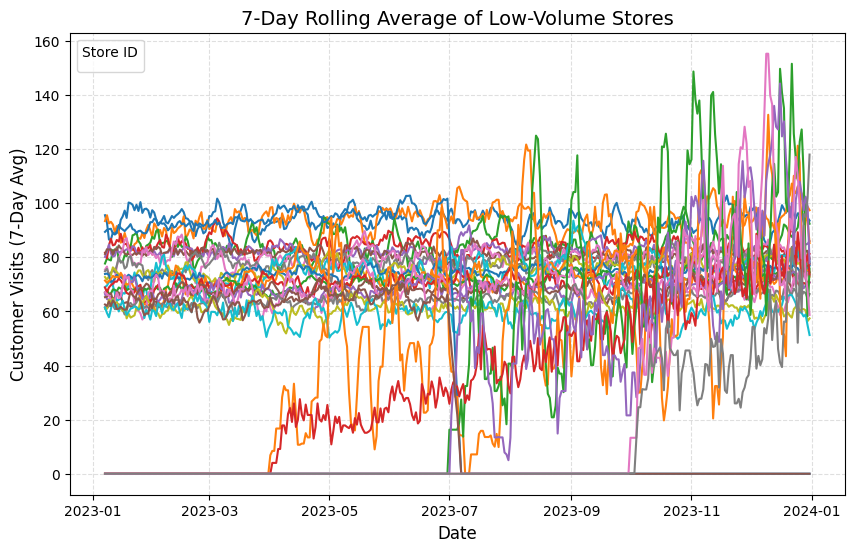

In [26]:
# Setting the rolling average to 7 days
rolling_average = StoreDailyCustomers.rolling(window=period).mean()

# selected the low-volume stores
selected = ['HWR', 'XCM', 'IIU', 'XKX', 'ICK', 'YQR', 'YWC', 'VPA', 'UVL', 'FOX', 'ZCW', 'VCF', 'ZIG', 'FWI', 'VKP', 'GCC', 'WQK', 'HOF', 'GIN', 'WWU', 'AIO', 'ZWJ', 'QUF', 'RBZ', 'AQZ', 'BCD', 'QOU', 'RIK']

# Plotting the daily customer count for each store
plt.figure(figsize=(10, 6))
plt.plot(rolling_average[selected], linewidth=1.5)

# Adding the labels and titles
plt.title('7-Day Rolling Average of Low-Volume Stores', fontsize=14)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Customer Visits (7-Day Avg)', fontsize=12)

# Adding the legend
plt.legend(title='Store ID')
plt.grid(True, linestyle='--', alpha=0.4)

plt.show()

Isolating the 7-day rolling average for all medium volume stores with linear growth patterns

<ipython-input-27-98a84fa8665f>:25: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title='Store ID')


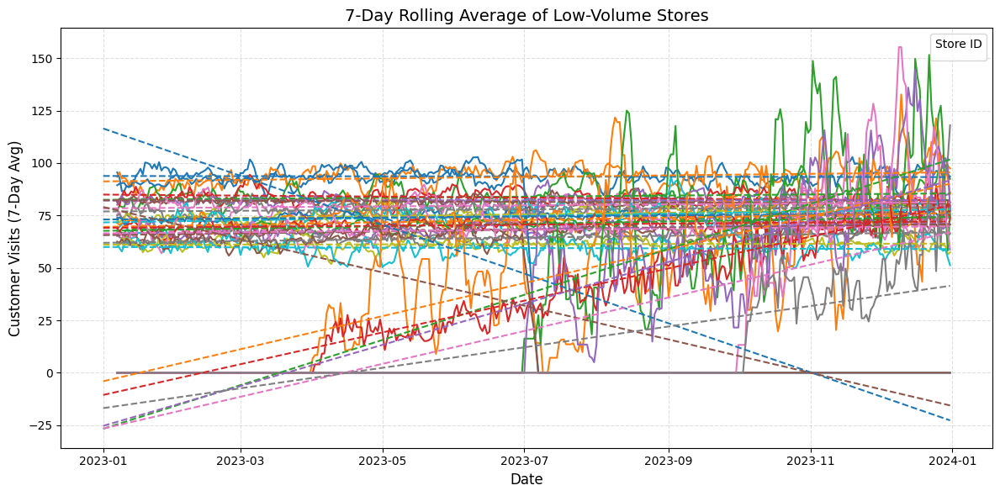

In [27]:
# Setting the rolling average to 7 days
rolling_average = StoreDailyCustomers.rolling(window=period).mean()

# selected the low-volume stores
selected = ['HWR', 'XCM', 'IIU', 'XKX', 'ICK', 'YQR', 'YWC', 'VPA', 'UVL', 'FOX', 'ZCW', 'VCF', 'ZIG', 'FWI', 'VKP', 'GCC', 'WQK', 'HOF', 'GIN', 'WWU', 'AIO', 'ZWJ', 'QUF', 'RBZ', 'AQZ', 'BCD', 'QOU', 'RIK']

# Plotting the daily customer count for each store
plt.figure(figsize=(12, 6))
plt.plot(rolling_average[selected], linewidth=1.5)
plt.gca().set_prop_cycle(None)

# overlay all linear trend lines for each store
for name in selected:
    x = np.arange(len(StoreDailyCustomers[name]))
    z = np.polyfit(x, StoreDailyCustomers[name], 1)
    trend = np.poly1d(z)
    plt.plot(StoreDailyCustomers.index, trend(x), linestyle='--')

# Adding the labels and titles
plt.title('7-Day Rolling Average of Low-Volume Stores', fontsize=14)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Customer Visits (7-Day Avg)', fontsize=12)

# Adding the legend
plt.legend(title='Store ID')
plt.grid(True, linestyle='--', alpha=0.4)

plt.tight_layout()
plt.show()

### Heatmap

Understand the correlation in the summary dataset

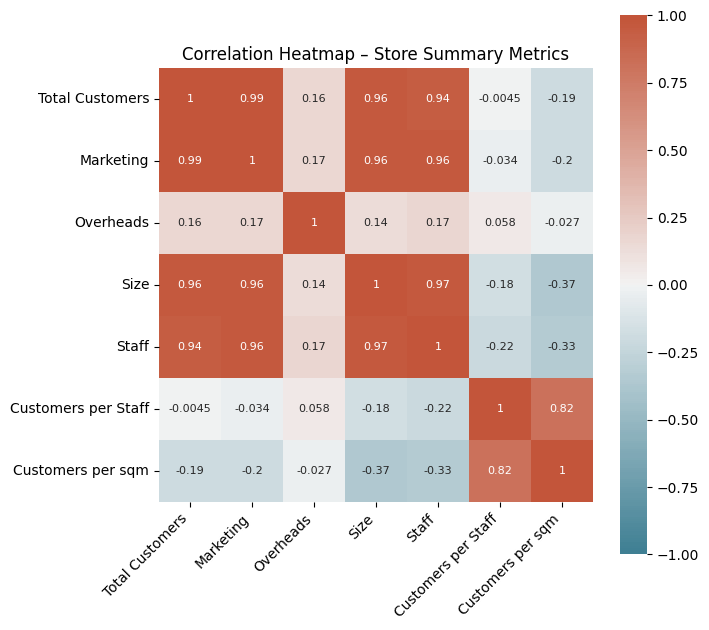

In [28]:
# Creating the base summary
summary_data = pd.DataFrame(index=StoreDailyCustomers.columns)
summary_data['Total Customers'] = StoreDailyCustomers.sum().values
summary_data['Marketing'] = StoreMarketing.values
summary_data['Overheads'] = StoreOverheads.values
summary_data['Size'] = StoreSize.values
summary_data['Staff'] = StoreStaff.values

# Adding derived metrics
summary_data['Customers per Staff'] = summary_data['Total Customers'] / summary_data['Staff']
summary_data['Customers per sqm'] = summary_data['Total Customers'] / summary_data['Size']

# Correlation heatmap
plt.figure(figsize=(7, 7))
corr = summary_data.corr()
ax = sns.heatmap(
    corr, vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(220, 20, n=200),
    square=True, annot=True, annot_kws={"size": 8}
)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.title('Correlation Heatmap – Store Summary Metrics')
plt.show()

Use scatter plots to check Total Customers vs Marketing (Segmented by Store Volume)

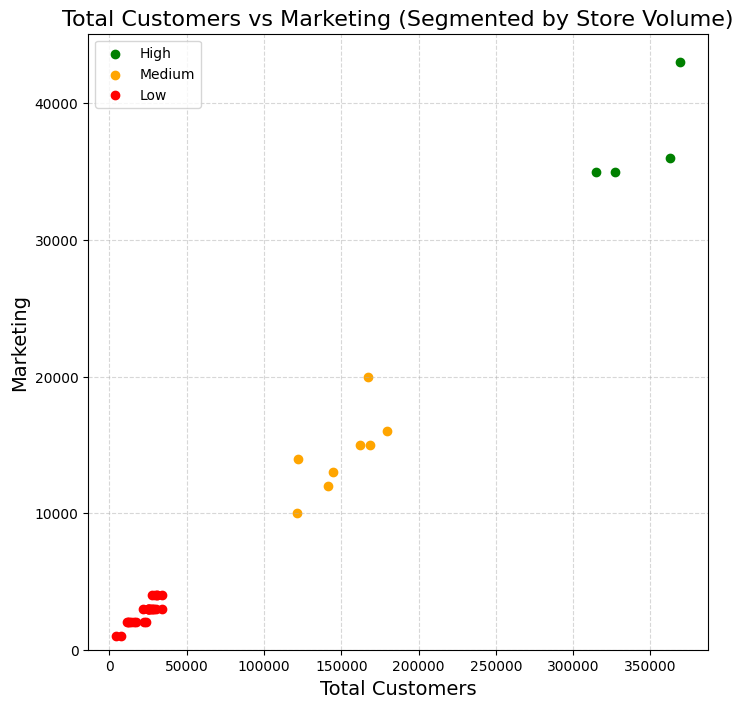

In [29]:
# Defining the thresholds
summary_data_high = summary_data.loc[summary_data['Total Customers'] > 250000]
summary_data_medium = summary_data.loc[(summary_data['Total Customers'] > 100000) & (summary_data['Total Customers'] <= 250000)]
summary_data_low = summary_data.loc[summary_data['Total Customers'] <= 100000]

# Scatter plot
plt.figure(figsize=(8, 8))

# Plotting each segment in different colours
plt.scatter(summary_data_high['Total Customers'], summary_data_high['Marketing'], label='High', color='green')
plt.scatter(summary_data_medium['Total Customers'], summary_data_medium['Marketing'], label='Medium', color='orange')
plt.scatter(summary_data_low['Total Customers'], summary_data_low['Marketing'], label='Low', color='red')

# Adding the labels and titles
plt.title('Total Customers vs Marketing (Segmented by Store Volume)', fontsize=16)
plt.xlabel('Total Customers', fontsize=14)
plt.ylabel('Marketing', fontsize=14)
plt.ylim(bottom=0)
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend()
plt.show()

Use scatter plots to check Total Customers vs Store Size (Segmented by Total Customers)

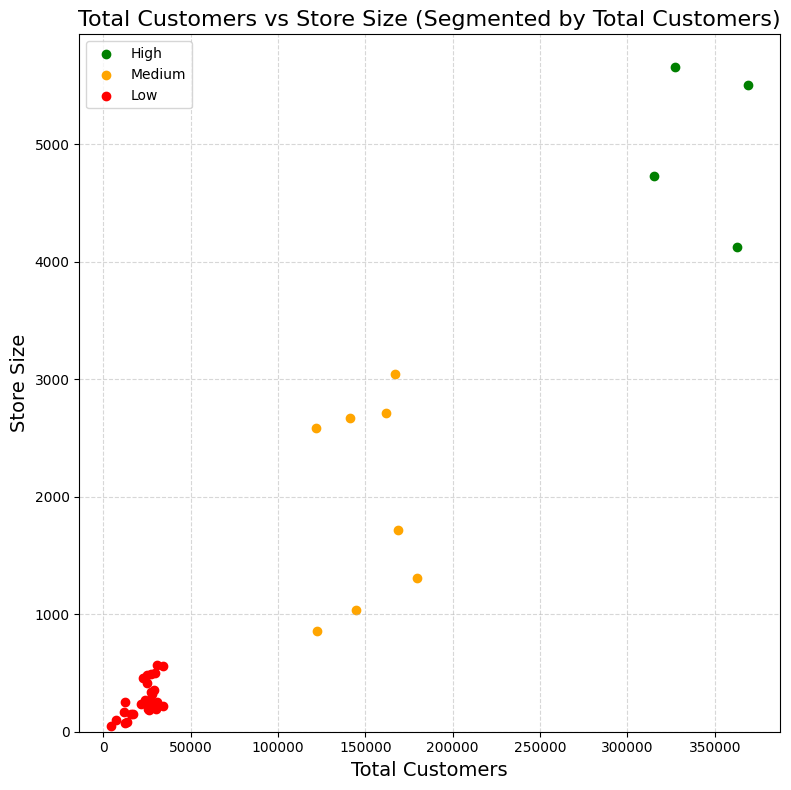

In [30]:
# Defining the thresholds
summary_data_high = summary_data.loc[summary_data['Total Customers'] > 250000]
summary_data_medium = summary_data.loc[(summary_data['Total Customers'] > 100000) & (summary_data['Total Customers'] <= 250000)]
summary_data_low = summary_data.loc[summary_data['Total Customers'] <= 100000]

# Scatter plot
plt.figure(figsize=(8, 8))

# Plotting each segment in different colours
plt.scatter(summary_data_high['Total Customers'], summary_data_high['Size'], label='High', color='green')
plt.scatter(summary_data_medium['Total Customers'], summary_data_medium['Size'], label='Medium', color='orange')
plt.scatter(summary_data_low['Total Customers'], summary_data_low['Size'], label='Low', color='red')

# Adding the labels and titles
plt.title('Total Customers vs Store Size (Segmented by Total Customers)', fontsize=16)
plt.xlabel('Total Customers', fontsize=14)
plt.ylabel('Store Size', fontsize=14)
plt.ylim(bottom=0)
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend()
plt.tight_layout()
plt.show()

Use scatter plots to check Total Customers vs Number of Staff (Segmented by Total Customers)

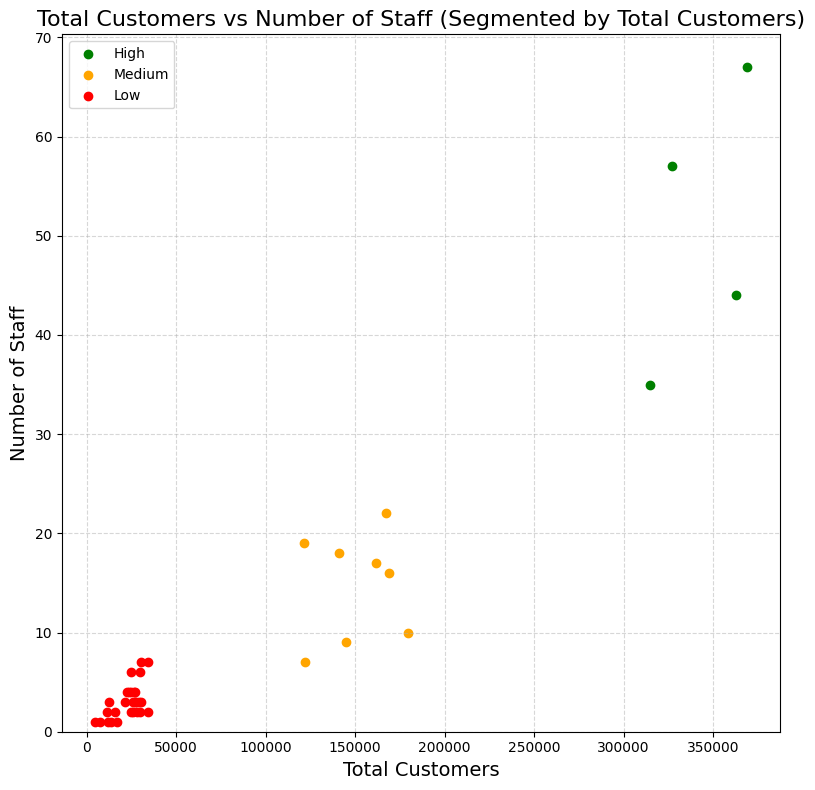

In [31]:
# Defining the thresholds
summary_data_high = summary_data.loc[summary_data['Total Customers'] > 250000]
summary_data_medium = summary_data.loc[(summary_data['Total Customers'] > 100000) & (summary_data['Total Customers'] <= 250000)]
summary_data_low = summary_data.loc[summary_data['Total Customers'] <= 100000]

# Scatter plot
plt.figure(figsize=(8, 8))

# Plotting each segment in different colours
plt.scatter(summary_data_high['Total Customers'], summary_data_high['Staff'], label='High', color='green')
plt.scatter(summary_data_medium['Total Customers'], summary_data_medium['Staff'], label='Medium', color='orange')
plt.scatter(summary_data_low['Total Customers'], summary_data_low['Staff'], label='Low', color='red')

# Adding the labels and titles
plt.title('Total Customers vs Number of Staff (Segmented by Total Customers)', fontsize=16)
plt.xlabel('Total Customers', fontsize=14)
plt.ylabel('Number of Staff', fontsize=14)
plt.ylim(bottom=0)
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend()
plt.tight_layout()
plt.show()

Use scatter plots to check Marketing vs Number of Staff (Segmented by Total Customers)

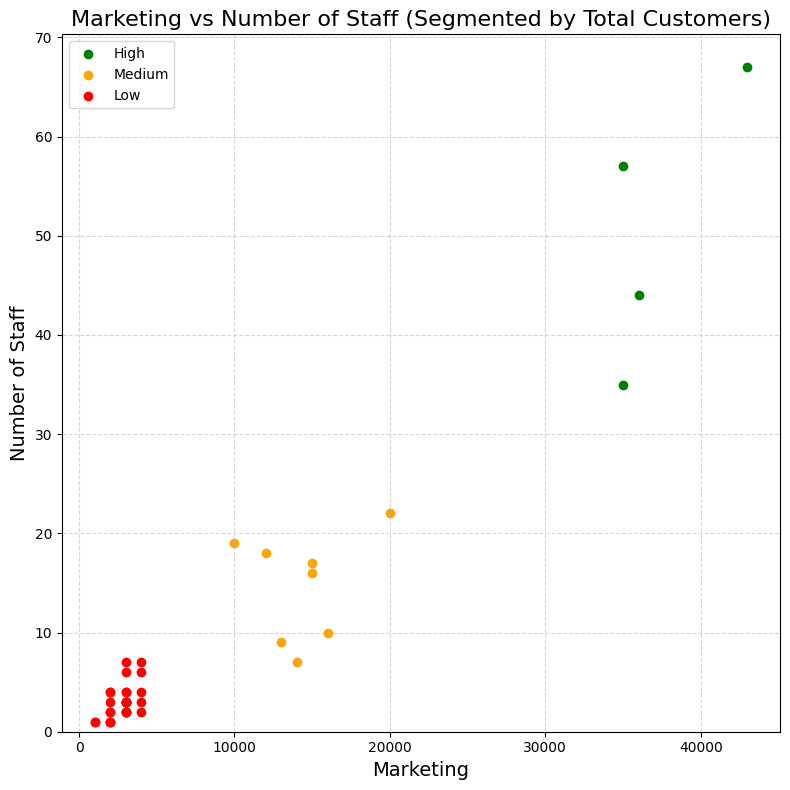

In [32]:
# Defining the thresholds
summary_data_high = summary_data.loc[summary_data['Total Customers'] > 250000]
summary_data_medium = summary_data.loc[(summary_data['Total Customers'] > 100000) & (summary_data['Total Customers'] <= 250000)]
summary_data_low = summary_data.loc[summary_data['Total Customers'] <= 100000]

# Scatter plot
plt.figure(figsize=(8, 8))

# Plotting each segment in different colours
plt.scatter(summary_data_high['Marketing'], summary_data_high['Staff'], label='High', color='green')
plt.scatter(summary_data_medium['Marketing'], summary_data_medium['Staff'], label='Medium', color='orange')
plt.scatter(summary_data_low['Marketing'], summary_data_low['Staff'], label='Low', color='red')

# Adding the labels and titles
plt.title('Marketing vs Number of Staff (Segmented by Total Customers)', fontsize=16)
plt.xlabel('Marketing', fontsize=14)
plt.ylabel('Number of Staff', fontsize=14)
plt.ylim(bottom=0)
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend()
plt.tight_layout()
plt.show()

Use scatter plts to check Marketing vs Store Size (Segmented by Total Customers)

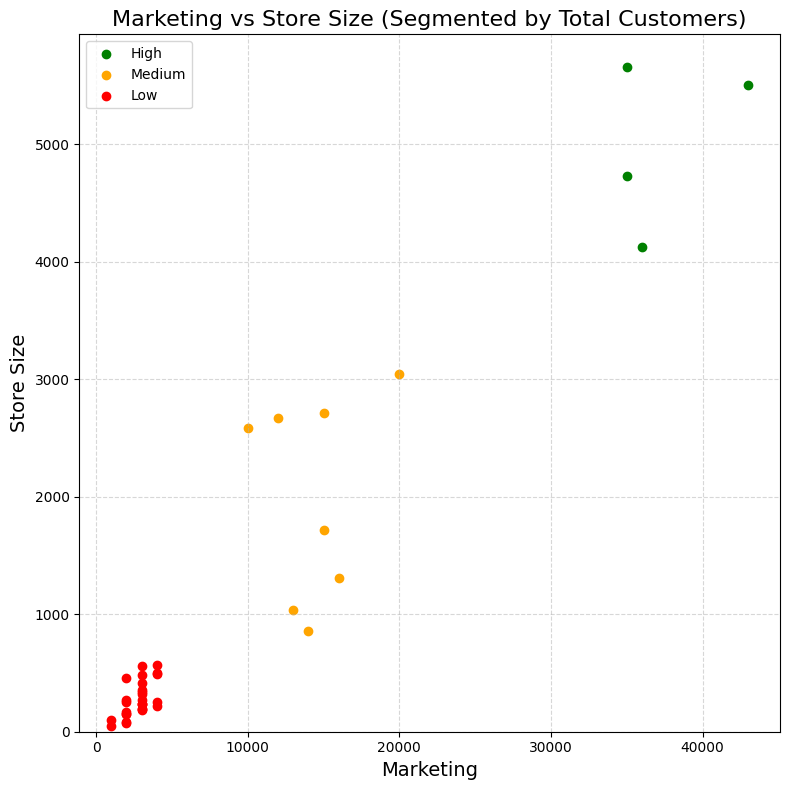

In [33]:
# Defining the thresholds
summary_data_high = summary_data.loc[summary_data['Total Customers'] > 250000]
summary_data_medium = summary_data.loc[(summary_data['Total Customers'] > 100000) & (summary_data['Total Customers'] <= 250000)]
summary_data_low = summary_data.loc[summary_data['Total Customers'] <= 100000]

# Scatter plot
plt.figure(figsize=(8, 8))

# Plotting each segment in different colours
plt.scatter(summary_data_high['Marketing'], summary_data_high['Size'], label='High', color='green')
plt.scatter(summary_data_medium['Marketing'], summary_data_medium['Size'], label='Medium', color='orange')
plt.scatter(summary_data_low['Marketing'], summary_data_low['Size'], label='Low', color='red')

# Adding the labels and titles
plt.title('Marketing vs Store Size (Segmented by Total Customers)', fontsize=16)
plt.xlabel('Marketing', fontsize=14)
plt.ylabel('Store Size', fontsize=14)
plt.ylim(bottom=0)
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend()
plt.tight_layout()
plt.show()

Use scatter plts to check Store Size vs Staff Count (Segmented by Total Customers)

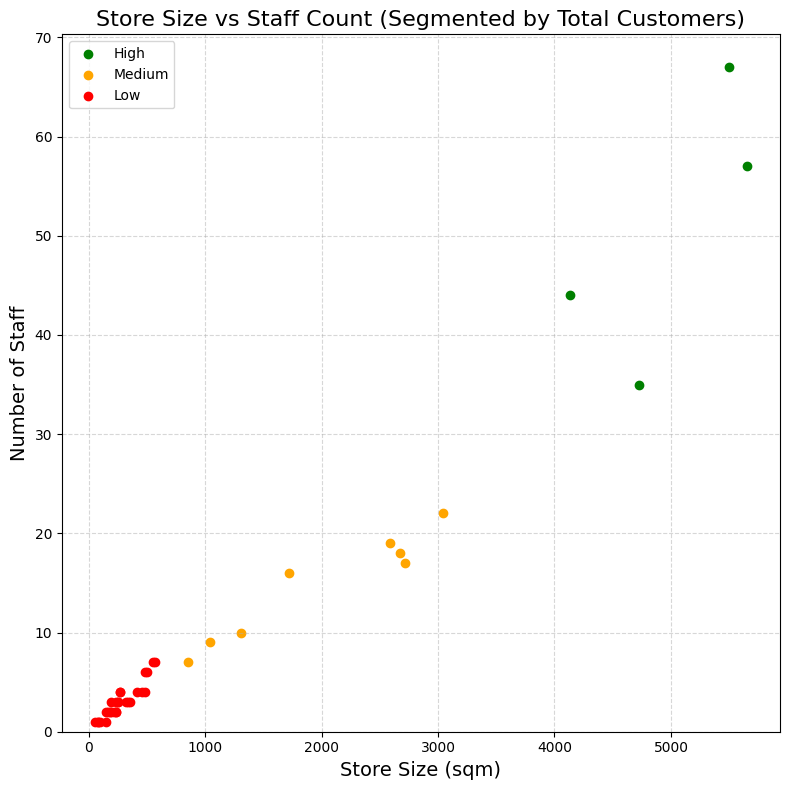

In [34]:
# Defining the thresholds
summary_data_high = summary_data.loc[summary_data['Total Customers'] > 250000]
summary_data_medium = summary_data.loc[(summary_data['Total Customers'] > 100000) & (summary_data['Total Customers'] <= 250000)]
summary_data_low = summary_data.loc[summary_data['Total Customers'] <= 100000]

# Scatter plot
plt.figure(figsize=(8, 8))

# Plotting each segment in different colours
plt.scatter(summary_data_high['Size'], summary_data_high['Staff'], label='High', color='green')
plt.scatter(summary_data_medium['Size'], summary_data_medium['Staff'], label='Medium', color='orange')
plt.scatter(summary_data_low['Size'], summary_data_low['Staff'], label='Low', color='red')

# Adding the labels and titles
plt.title('Store Size vs Staff Count (Segmented by Total Customers)', fontsize=16)
plt.xlabel('Store Size (sqm)', fontsize=14)
plt.ylabel('Number of Staff', fontsize=14)
plt.ylim(bottom=0)
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend()
plt.tight_layout()
plt.show()

Use scatter plts to check Customers per Staff vs Customers per sqm (Segmented by Total Customers)

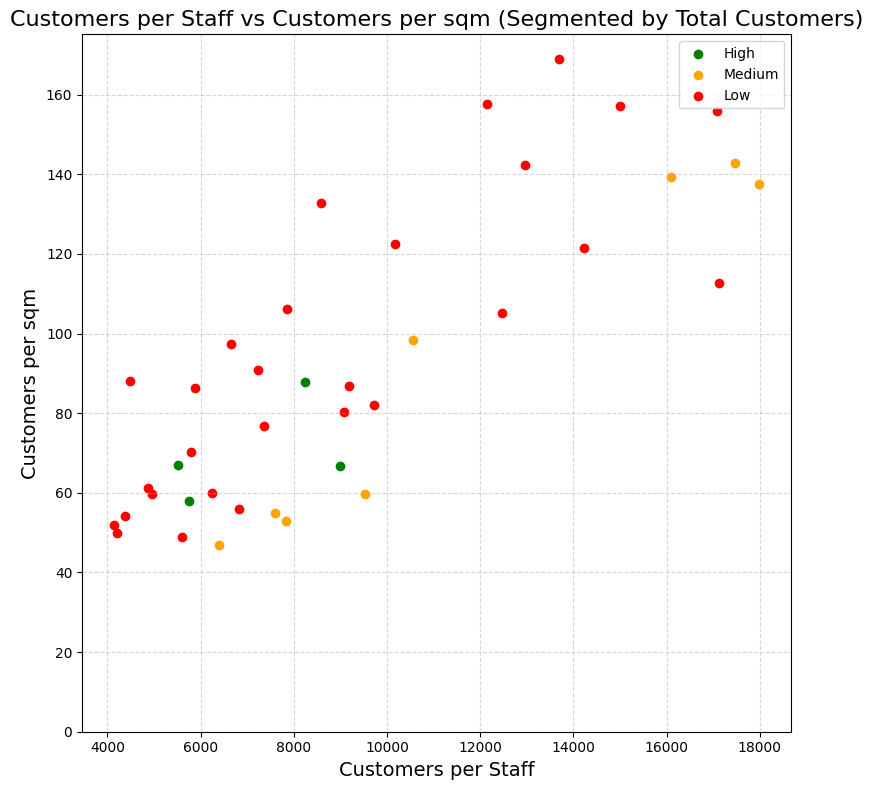

In [35]:
# Defining the thresholds
summary_data_high = summary_data.loc[summary_data['Total Customers'] > 250000]
summary_data_medium = summary_data.loc[(summary_data['Total Customers'] > 100000) & (summary_data['Total Customers'] <= 250000)]
summary_data_low = summary_data.loc[summary_data['Total Customers'] <= 100000]

# Scatter plot
plt.figure(figsize=(8, 8))

# Plotting each segment in different colours
plt.scatter(summary_data_high['Customers per Staff'], summary_data_high['Customers per sqm'], label='High', color='green')
plt.scatter(summary_data_medium['Customers per Staff'], summary_data_medium['Customers per sqm'], label='Medium', color='orange')
plt.scatter(summary_data_low['Customers per Staff'], summary_data_low['Customers per sqm'], label='Low', color='red')

# Adding the labels and titles
plt.title('Customers per Staff vs Customers per sqm (Segmented by Total Customers)', fontsize=16)
plt.xlabel('Customers per Staff', fontsize=14)
plt.ylabel('Customers per sqm', fontsize=14)
plt.ylim(bottom=0)
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend()
plt.tight_layout()
plt.show()

## Histogram

ploting a histogram to understand distribution of total daily customers across all stores

57 bins


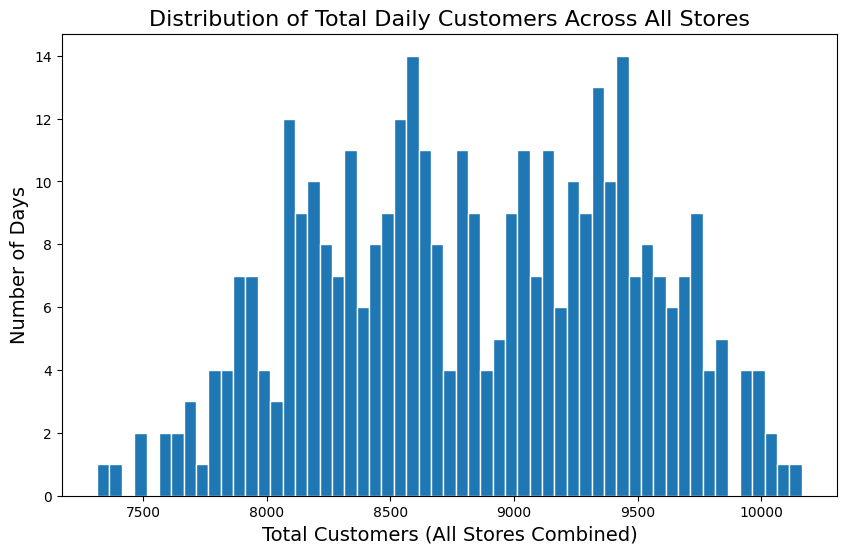

In [36]:
# Sum of customers
daily_totals = StoreDailyCustomers.sum(axis=1)

# Setting the bin parameters
x_min = int(daily_totals.min())
x_max = int(daily_totals.max())
bin_width = 50

# Creating the bin ranges
n_bins = int((x_max - x_min) / bin_width)
print(f'{n_bins} bins')
bins = [(x_min + x * bin_width) for x in range(n_bins + 1)]

# PLotting the histogram
plt.figure(figsize=(10, 6))
plt.hist(StoreDailyCustomers.sum(axis=1), bins, edgecolor='w')

# # Adding the labels and titles
plt.title('Distribution of Total Daily Customers Across All Stores', fontsize=16)
plt.xlabel('Total Customers (All Stores Combined)', fontsize=14)
plt.ylabel('Number of Days', fontsize=14)

plt.show()

All Individual store distributions of daily customer counts

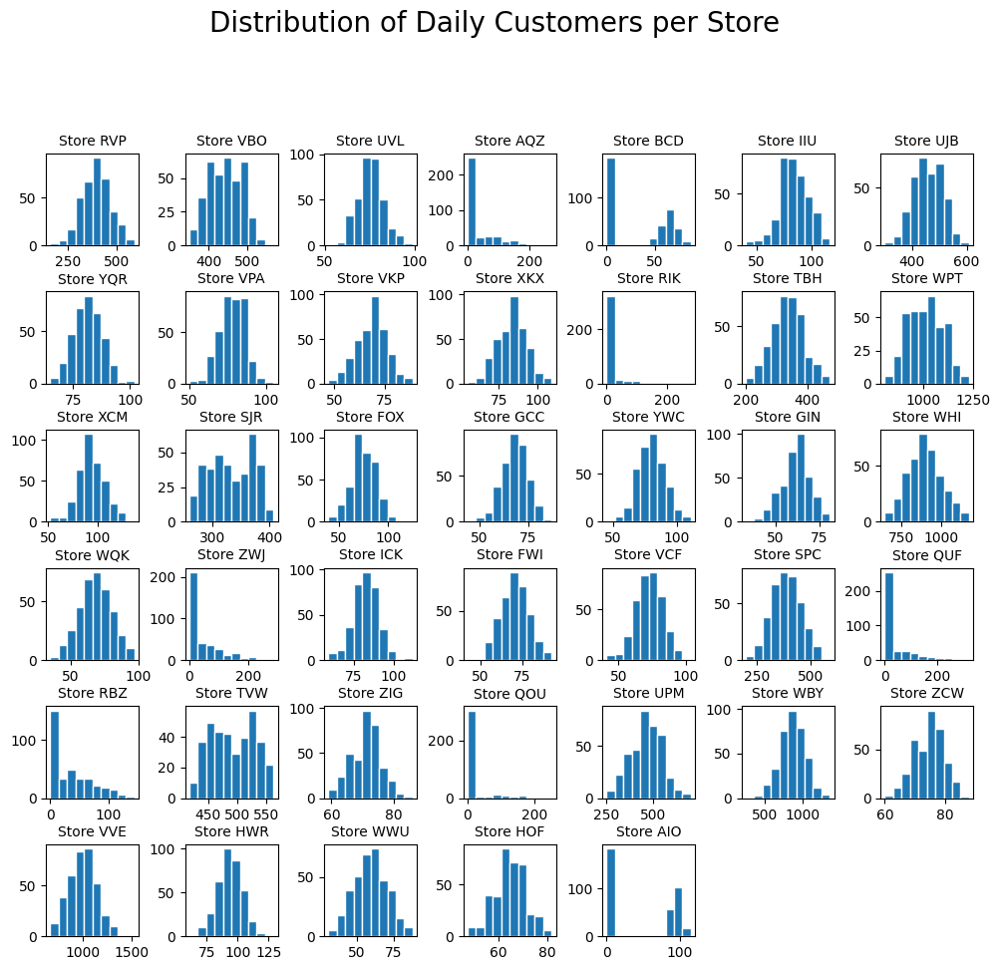

In [37]:
# Creating a grid of histograms
counter = 1
fig = plt.figure(figsize=(12, 12))
fig.suptitle('Distribution of Daily Customers per Store', fontsize=20, position=(0.5, 1.0))
for name in StoreDailyCustomers:
    sub = fig.add_subplot(7, 7, counter)
    sub.set_title('Store ' + name, fontsize=10)
    sub.hist(StoreDailyCustomers[name], edgecolor='w')
    counter += 1
plt.subplots_adjust(wspace=0.5, hspace=0.5)
plt.show()


the customer distribution for all high volume stores

25 bins


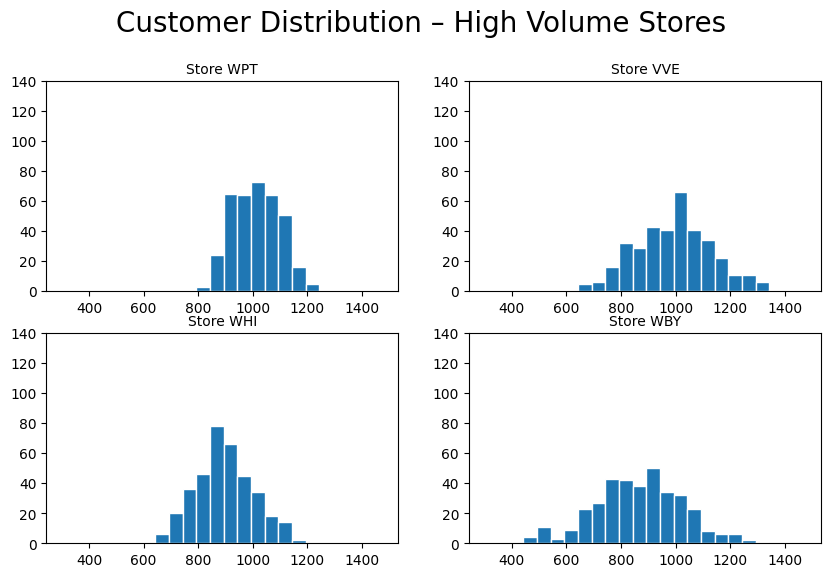

In [38]:
# selected the high-volume stores
selected = ['WPT', 'VVE', 'WHI', 'WBY']

# Setting the bin parameters
x_min = int(StoreDailyCustomers[selected].min().min())
x_max = int(StoreDailyCustomers[selected].max().max())
bin_width = 50

# Creating the bin ranges
n_bins = int((x_max - x_min) / bin_width)
print(f'{n_bins} bins')
bins = [(x_min + x * bin_width) for x in range(n_bins + 1)]

# PLotting the histogram
fig = plt.figure(figsize=(10, 6))
fig.suptitle('Customer Distribution – High Volume Stores', fontsize=20, position=(0.5, 1.0))
counter = 1
for name in selected:
    sub = fig.add_subplot(2, 2, counter)
    sub.hist(StoreDailyCustomers[name], bins, edgecolor='w')
    sub.set_title('Store ' + name, fontsize=10)
    sub.set_xlim(xmin=x_min, xmax=x_max)
    sub.set_ylim(ymin=0, ymax=140)
    counter += 1

plt.show()

The daily customer trends for all stores

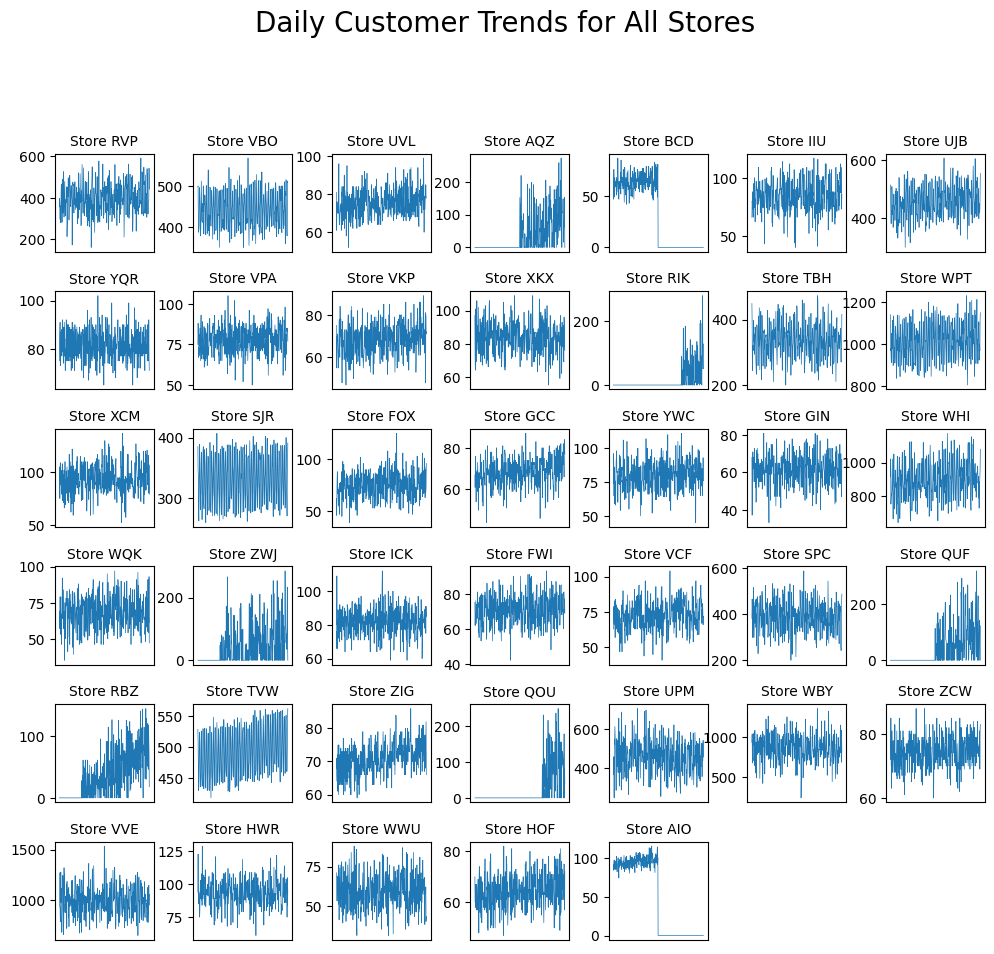

In [39]:
counter = 1
fig = plt.figure(figsize=(12, 12))
fig.suptitle('Daily Customer Trends for All Stores', fontsize=20, position=(0.5, 1.0))
for name in StoreDailyCustomers.columns:
    sub = fig.add_subplot(7, 7, counter)
    sub.set_title('Store ' + name, fontsize=10)
    sub.plot(StoreDailyCustomers.index, StoreDailyCustomers[name], linewidth=0.5)
    sub.axes.get_xaxis().set_ticks([])  # remove the x ticks
    counter += 1
plt.subplots_adjust(wspace=0.4, hspace=0.4)
plt.show()


Thr autocorrelations of daily customer counts per store

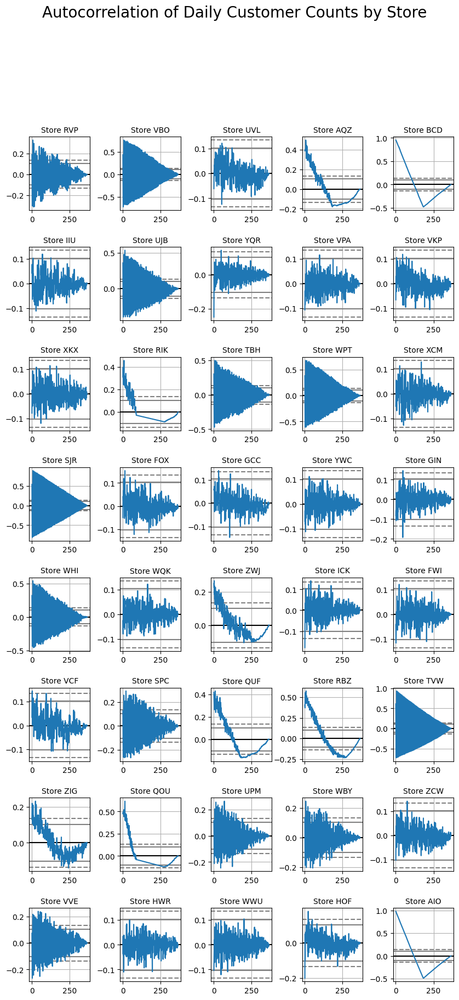

In [40]:
row = 0
col = 0
fig, axes = plt.subplots(figsize=(10, 20), nrows=8, ncols=5)
fig.suptitle('Autocorrelation of Daily Customer Counts by Store', fontsize=20, position=(0.5, 1.0))
for name in StoreDailyCustomers.columns:
    sub = pd.plotting.autocorrelation_plot(StoreDailyCustomers[name], axes[row, col])
    sub.set_title('Store ' + name, fontsize=10)
    sub.xaxis.label.set_visible(False)
    sub.yaxis.label.set_visible(False)
    col += 1
    if col == 5:
        row += 1
        col = 0
plt.subplots_adjust(wspace=0.5, hspace=0.5)
plt.show()


Autocorrelation for selected stores

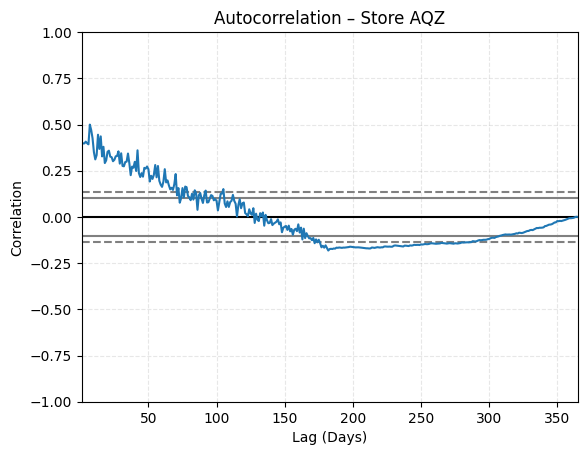

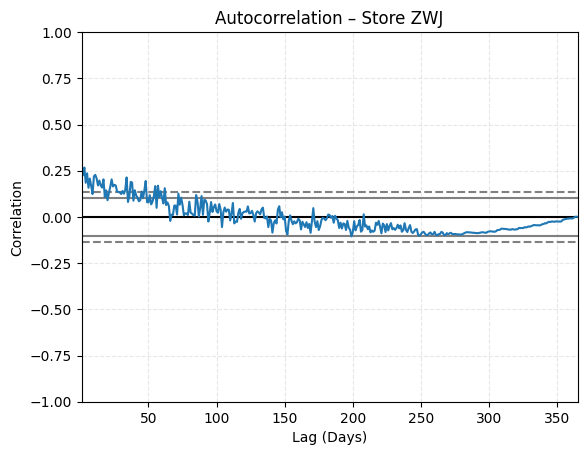

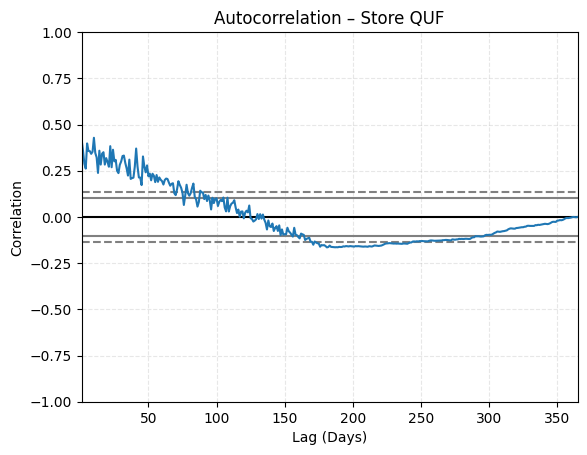

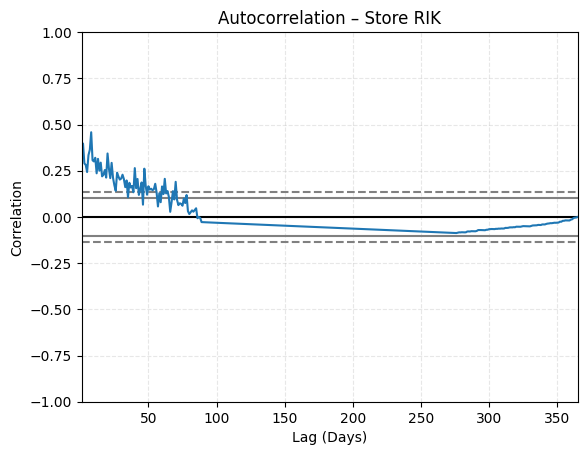

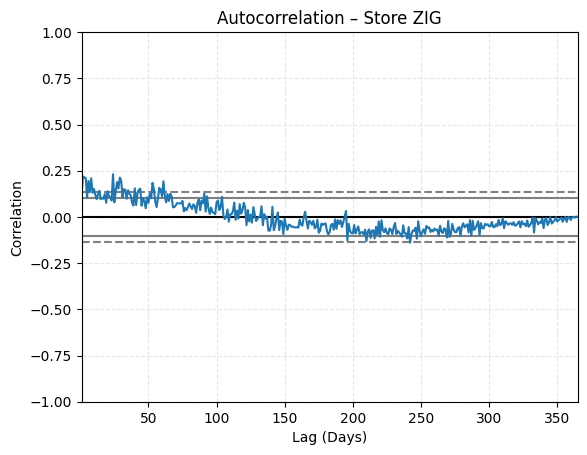

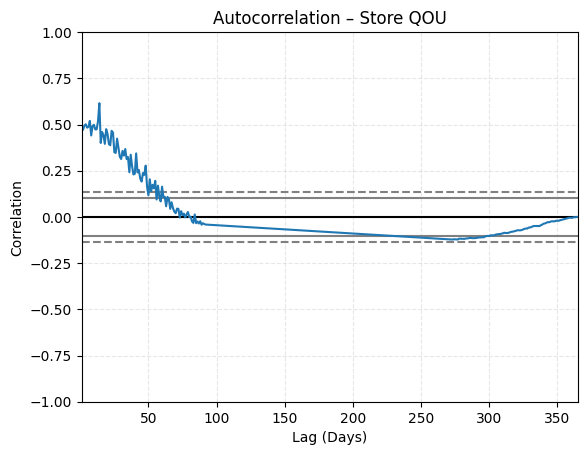

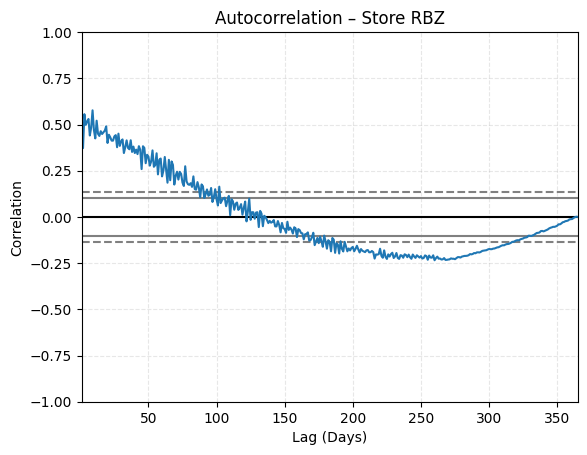

In [41]:
# selected store
selected = ['AQZ', 'ZWJ', 'QUF', 'RIK', 'ZIG', 'QOU', 'RBZ']

for name in selected:
    pd.plotting.autocorrelation_plot(StoreDailyCustomers[name])

    plt.title(f'Autocorrelation – Store {name}')
    plt.xlabel('Lag (Days)')
    plt.ylabel('Correlation')
    plt.grid(True, linestyle='--', alpha=0.3)
    plt.show()

The marketing expenditure vs total customers per store

<ipython-input-42-8b3be50ed355>:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.annotate(name, (summary_data['Marketing'][i] + 300, summary_data['Customers'][i]))


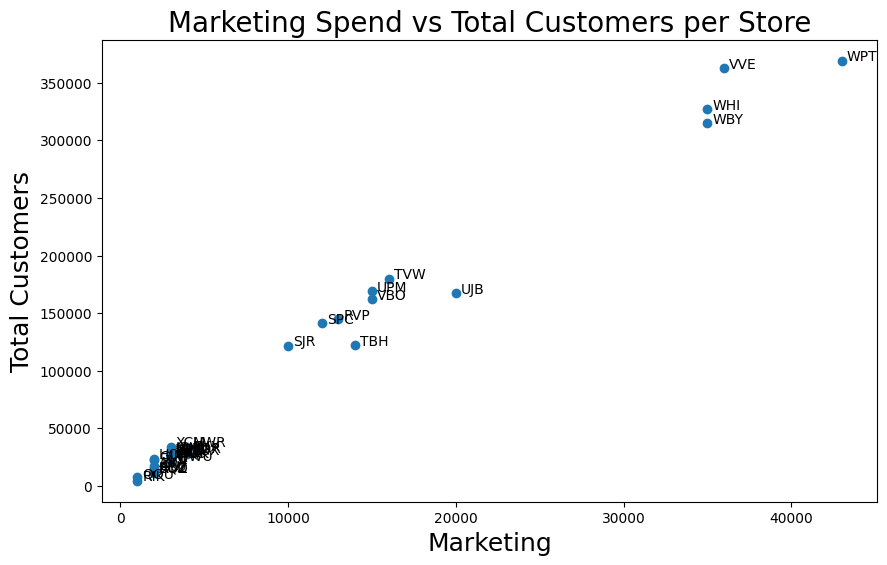

In [42]:
# Create the summary dataframe
summary_data = pd.DataFrame(index=StoreDailyCustomers.columns)
summary_data['Customers'] = StoreDailyCustomers.sum().values
summary_data['Marketing'] = StoreMarketing.values
summary_data['Overheads'] = StoreOverheads.values
summary_data['Size'] = StoreSize.values
summary_data['Staff'] = StoreStaff.values
summary_data['Customers per Staff'] = summary_data['Customers'] / summary_data['Staff']
summary_data['Customers per sqm'] = summary_data['Customers'] / summary_data['Size']

# Plotting tthe chart
plt.figure(figsize=(10, 6))
plt.scatter(summary_data['Marketing'], summary_data['Customers'])

# adding the title and labels
plt.title('Marketing Spend vs Total Customers per Store', fontsize=20)
plt.xlabel('Marketing', fontsize=18)
plt.ylabel('Total Customers', fontsize=18)
for i, name in enumerate(StoreDailyCustomers.columns):
    plt.annotate(name, (summary_data['Marketing'][i] + 300, summary_data['Customers'][i]))
plt.show()


All nar charts for store level metrics

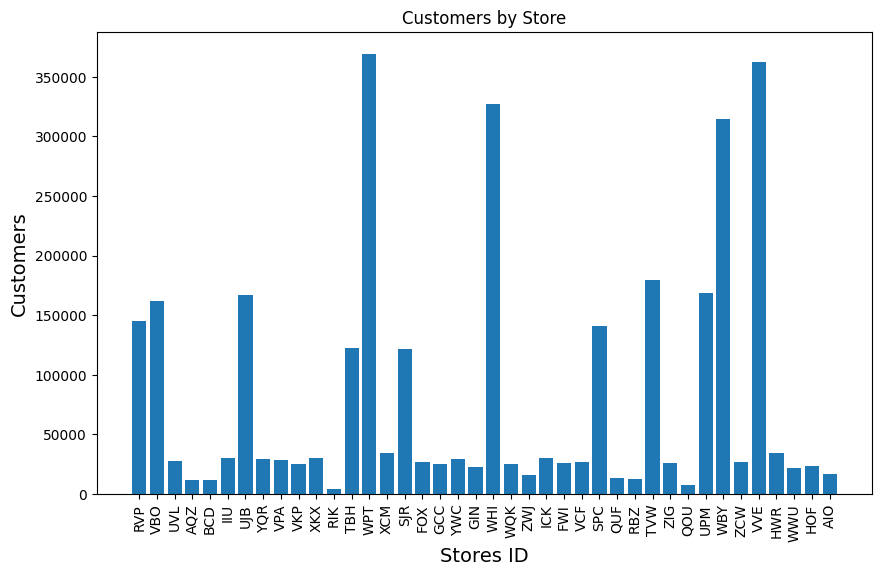

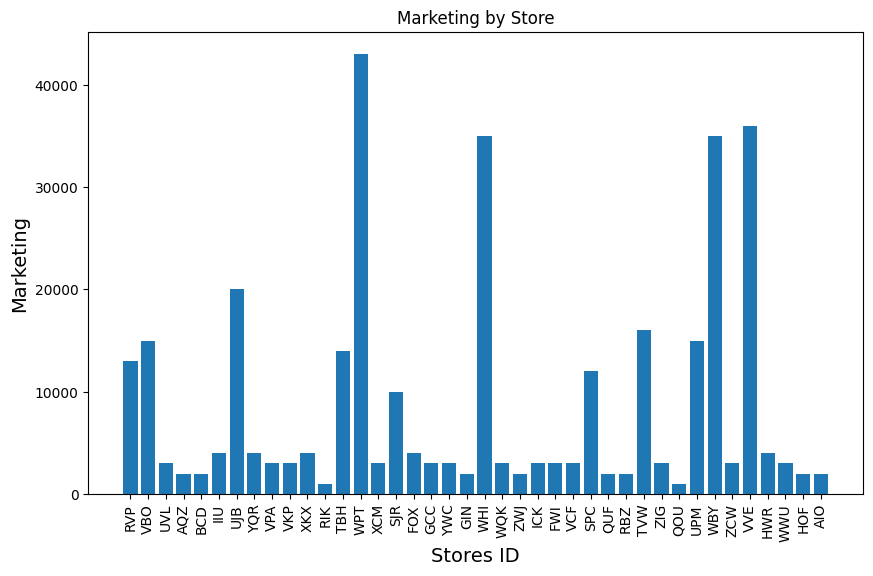

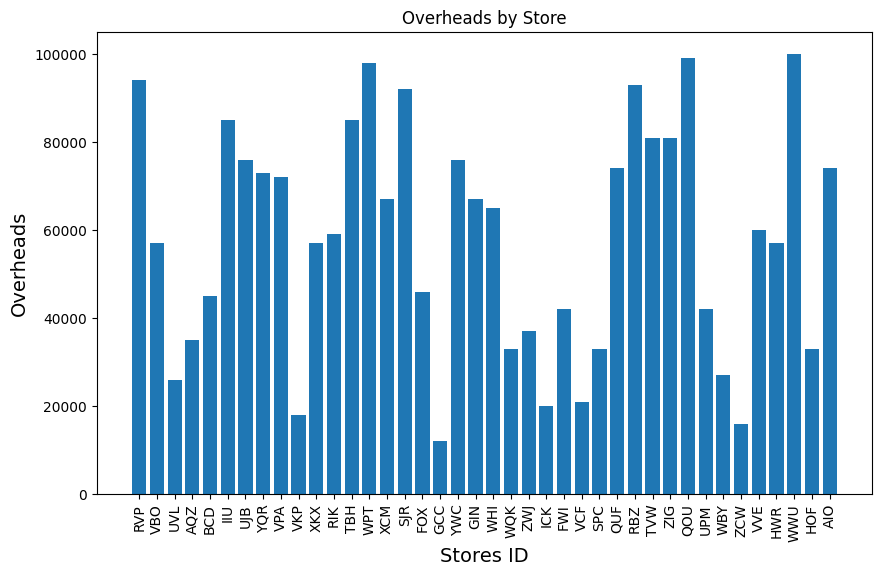

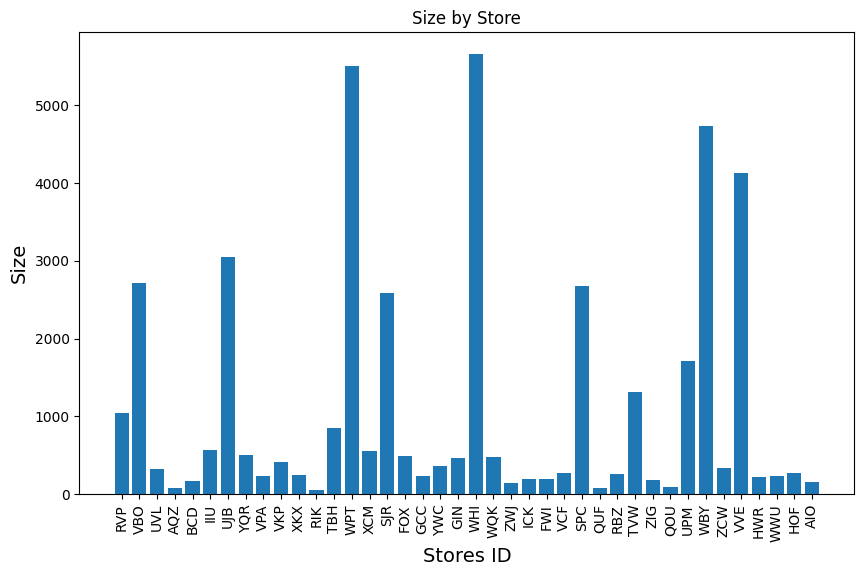

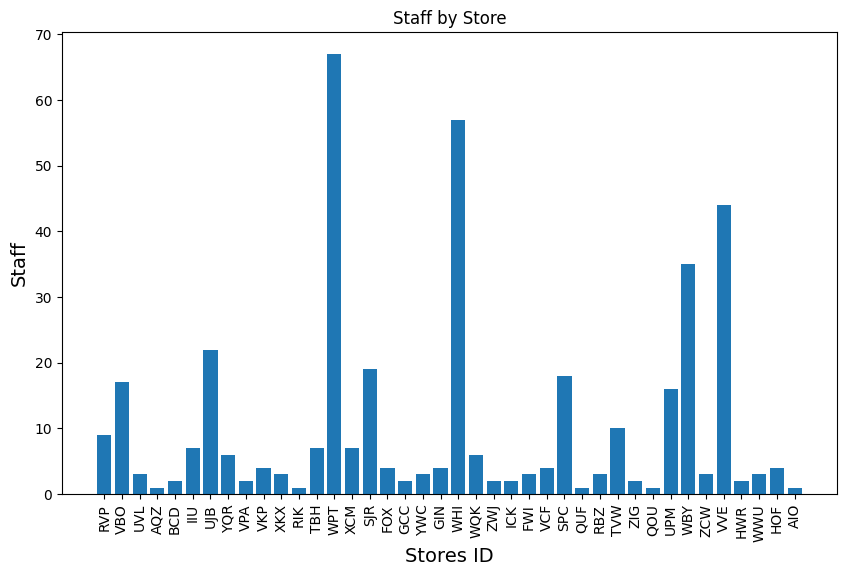

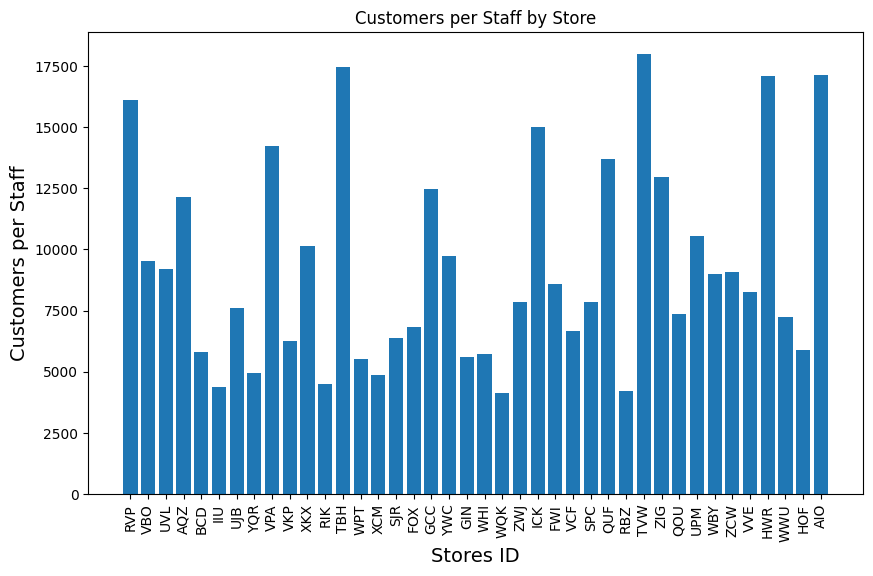

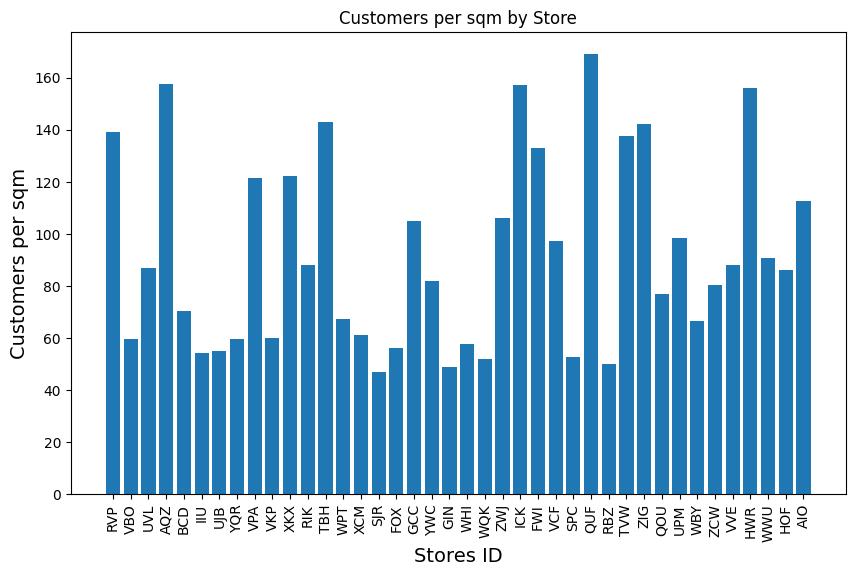

In [43]:
# Create the summary dataframe
summary_data = pd.DataFrame(index=StoreDailyCustomers.columns)
summary_data['Customers'] = StoreDailyCustomers.sum().values
summary_data['Marketing'] = StoreMarketing.values
summary_data['Overheads'] = StoreOverheads.values
summary_data['Size'] = StoreSize.values
summary_data['Staff'] = StoreStaff.values
summary_data['Customers per Staff'] = summary_data['Customers'] / summary_data['Staff']
summary_data['Customers per sqm'] = summary_data['Customers'] / summary_data['Size']

for attribute in summary_data:
    plt.figure(figsize=(10, 6))
    x_pos = np.arange(len(summary_data.index))
    plt.bar(x_pos, summary_data[attribute], align='center')
    plt.xticks(x_pos, summary_data.index, rotation=90)
    plt.xlabel('Stores ID', fontsize=14)
    plt.ylabel(attribute, fontsize=14)
    plt.title(f'{attribute} by Store')
    plt.show()


Bar Chart Grid of Store Metrics

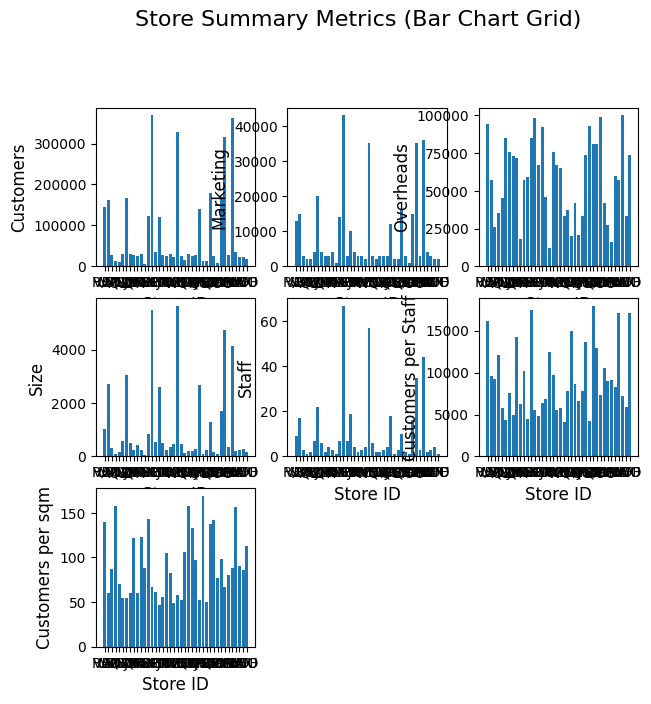

In [44]:
plt.figure(figsize=(7, 7))
counter = 1
x_pos = np.arange(len(summary_data.index))
for attribute in summary_data:
    sub = plt.subplot(3, 3, counter)
    sub.bar(x_pos, summary_data[attribute], align='center')
    sub.set_xticks([])
    sub.set_xticks(x_pos)
    sub.set_xticklabels(summary_data.index)
    sub.set_xlabel('Store ID', fontsize=12)
    sub.set_ylabel(attribute, fontsize=12)
    counter += 1
plt.suptitle('Store Summary Metrics (Bar Chart Grid)', fontsize=16, y=1.02)
plt.show()

Normalised the metric comparision for all high volume stores

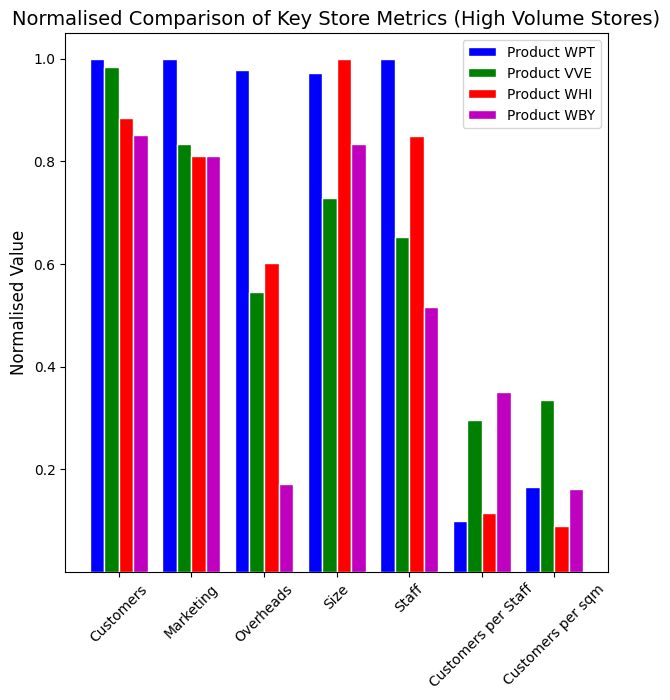

In [45]:
# selected high volume stores
selected = ['WPT', 'VVE', 'WHI', 'WBY']

# Min and max normalisation
normalised_data = (summary_data - summary_data.min()) / (summary_data.max() - summary_data.min())

# setting the colours
colours = ['b', 'g', 'r', 'm', 'c', 'y', 'k']
plt.figure(figsize=(7, 7))
c = 0
n_bars = len(selected)
x_pos_base = np.arange(len(summary_data.columns))
bar_width = 0.8 / n_bars
for name in selected:
    values = normalised_data.loc[[name]].values.flatten().tolist()
    x_pos = [x + (bar_width * c) for x in x_pos_base]
    plt.bar(x_pos, values, color=colours[c % len(colours)],
            width=bar_width, edgecolor='white', label='Product ' + name)
    c += 1
plt.yticks([0.2, 0.4, 0.6, 0.8, 1.0])
x_pos = [x + (bar_width * (c - 1) / 2) for x in x_pos_base]
plt.xticks(x_pos, summary_data.columns, rotation=45)
plt.title('Normalised Comparison of Key Store Metrics (High Volume Stores)', fontsize=14)
plt.ylabel('Normalised Value', fontsize=12)
plt.legend()

plt.show()

The Radar Chart

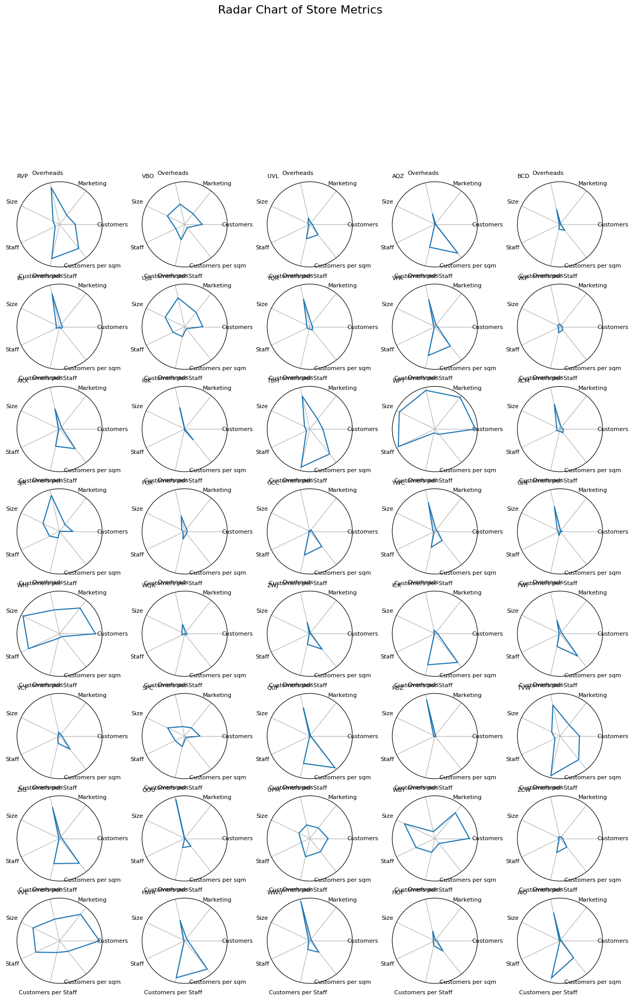

In [46]:
# Getting the number of stores length
n_attributes = len(summary_data.columns)

#calculations of the angles
angles = [n / float(n_attributes) * 2 * np.pi for n in range(n_attributes + 1)]
plt.figure(figsize=(15, 20))
counter = 1
for name in normalised_data.index:
    values = normalised_data.loc[[name]].values.flatten().tolist()
    values += values[:1]
    sub = plt.subplot(8, 5, counter, polar=True)
    sub.plot(angles, values)
    sub.set_ylim(ymax=1.05)
    sub.set_yticks([])
    sub.set_xticks(angles[0:-1])
    sub.set_xticklabels(normalised_data.columns, fontsize=8)
    sub.set_title(name, fontsize=8, loc='left')
    counter += 1

plt.suptitle('Radar Chart of Store Metrics', fontsize=16, y=1.05)

plt.show()

Different Radar chart of all high volume stores

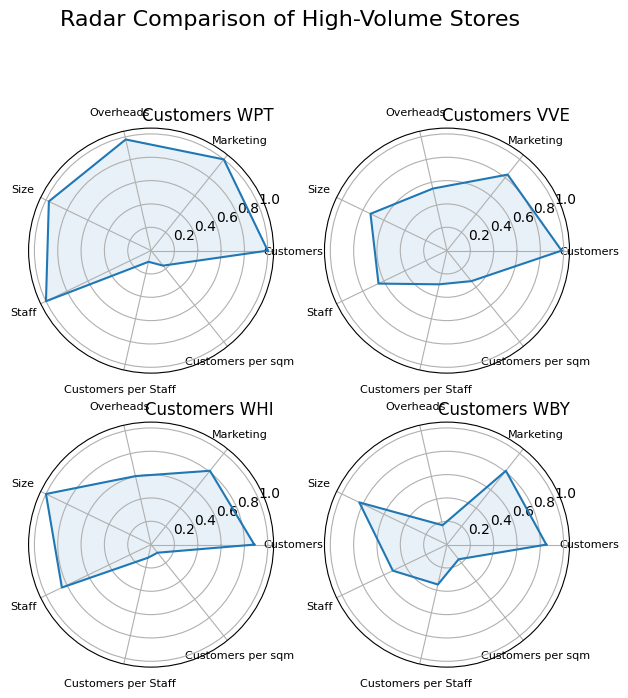

In [47]:
# Getting the number of stores length
n_attributes = len(normalised_data.columns)

#calculations of the angles
angles = [n / float(n_attributes) * 2 * np.pi for n in range(n_attributes + 1)]
plt.figure(figsize=(7, 7))
counter = 1
for name in selected:
    values = normalised_data.loc[[name]].values.flatten().tolist()
    values += values[:1]
    sub = plt.subplot(2, 2, counter, polar=True)
    sub.plot(angles, values)
    sub.fill(angles, values, alpha=0.1)
    sub.set_ylim(ymax=1.05)
    sub.set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
    sub.set_xticks(angles[0:-1])
    sub.set_xticklabels(normalised_data.columns, fontsize=8)
    sub.set_title('Customers ' + name, fontsize=12, loc='right')
    counter += 1

plt.suptitle('Radar Comparison of High-Volume Stores', fontsize=16, y=1.05)
plt.show()


The overlay of the radar comparision of the high volume stores

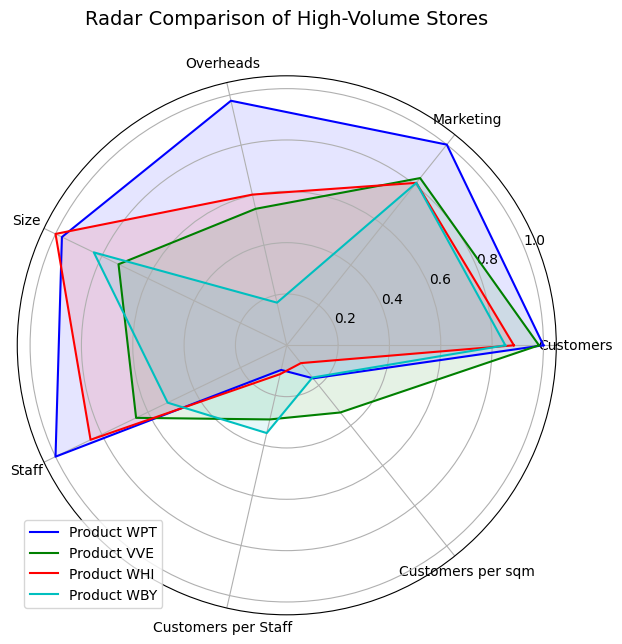

In [48]:
# Getting the number of stores length
n_attributes = len(normalised_data.columns)

#calculations of the angles
angles = [n / float(n_attributes) * 2 * np.pi for n in range(n_attributes + 1)]

# adding the colours
colours = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'w']
c = 0
plt.figure(figsize=(7, 7))
sub = plt.subplot(1, 1, 1, polar=True)
for name in selected:
    values = normalised_data.loc[[name]].values.flatten().tolist()
    values += values[:1]
    sub.plot(angles, values, colours[c % len(colours)], label='Product ' + name)
    sub.fill(angles, values, colours[c % len(colours)], alpha=0.1)
    sub.set_ylim(ymax=1.05)
    sub.set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
    sub.set_xticks(angles[0:-1])
    sub.set_xticklabels(normalised_data.columns)
    c += 1

# Add legend and show chart
plt.title('Radar Comparison of High-Volume Stores', fontsize=14, y=1.08)
plt.legend(loc='upper right')
plt.legend(loc=0)
plt.show()

Pairwise relationship matrix

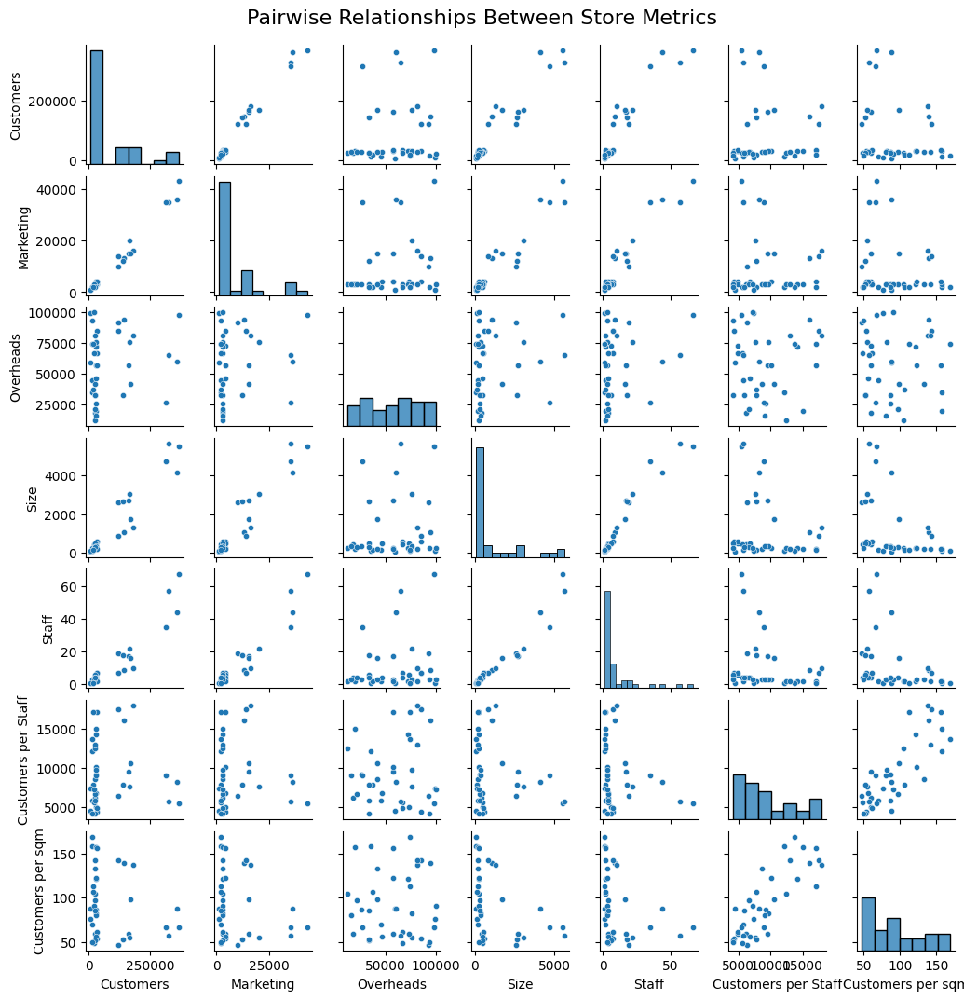

In [49]:
# creating the scatterplot matric for all the features
sns.pairplot(summary_data, height=1.5, plot_kws={'s': 20})
plt.suptitle('Pairwise Relationships Between Store Metrics', y=1.02, fontsize=16)
plt.show()

The interactive total customers count per store

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
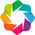

:Bars   [index]   (0)

In [50]:
hv.extension('bokeh')

# Calculate the total customers per store
total_customers = StoreDailyCustomers.sum().sort_values(ascending=False)

# Create hvplot chart
plot = total_customers.hvplot.bar(
    frame_height=400,
    frame_width=800,
    xlabel='Store ID',
    ylabel='Total Customers',
    title='Total Customers per Store',
    rot=90
)

plot

An interactive daily trends across all stores

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
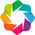

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

In [51]:
hv.extension('bokeh')

# Create hvplot chart
plot = StoreDailyCustomers.hvplot(
    xlabel='Date',
    ylabel='Daily Customers',
    title='Daily Customers for All Stores',
    frame_height=500,
    frame_width=900,
    legend='top_left'
)

plot

An interactive daily customer trands in the high volume stores

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
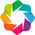

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

In [52]:
hv.extension('bokeh')

# Calculate total customers
total_customers = StoreDailyCustomers.sum().sort_values(ascending=False)

# Select high-volume stores
top_stores = total_customers.head(4).index
high_volume_data = StoreDailyCustomers[top_stores]

# Create hvplot chart
plot = high_volume_data.hvplot(
    xlabel='Date',
    ylabel='Daily Customers',
    title='Daily Customers – High Volume Stores',
    frame_height=500,
    frame_width=900,
    legend='top_left'
)

plot

All high volume stor trends with 7-Day Rolling Average

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
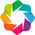

:Overlay
   .Curve.WPT.I  :Curve   [Date]   (WPT)
   .Curve.WPT.II :Curve   [Date]   (WPT)
   .Curve.VVE.I  :Curve   [Date]   (VVE)
   .Curve.VVE.II :Curve   [Date]   (VVE)
   .Curve.WHI.I  :Curve   [Date]   (WHI)
   .Curve.WHI.II :Curve   [Date]   (WHI)
   .Curve.WBY.I  :Curve   [Date]   (WBY)
   .Curve.WBY.II :Curve   [Date]   (WBY)

In [53]:
hv.extension('bokeh')

# Get hig volume stores by total customers
top_stores = StoreDailyCustomers.sum().sort_values(ascending=False).head(4).index
data = StoreDailyCustomers[top_stores]
rolling = data.rolling(7).mean()

# Creating overlays
plots = []
for store in top_stores:
    raw = data[store].hvplot(label=store, alpha=0.4, line_width=1)
    smooth = rolling[store].hvplot(label=None, line_width=3)
    plots.append(raw * smooth)

# Combining all overlays
final_plot = hv.Overlay(plots).opts(
    title='High Daily Customers Store\nwith 7-day Rolling Average',
    height=600,
    width=800,
    legend_position='top_left',
    xlabel='Date',
    ylabel='Daily Customers'
)

final_plot

An interactive correlation matrix of the store

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
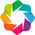

:Overlay
   .HeatMap.I :HeatMap   [columns,index]   (value)
   .Labels.I  :Labels   [x,y]   (value)

In [54]:
hv.extension('bokeh')  # Required in every Colab cell that shows hvplot

# Computing the correlation matrix
corr_matrix = summary_data.corr().round(2)

# Creating the heatmap
heatmap = summary_data.corr().hvplot.heatmap(
    frame_height=500,
    frame_width=600,
    title='Store-Level Metric Correlations',
    rot=45,
    cmap='coolwarm'
).opts(invert_yaxis=True, clim=(-1, 1))

# Adding the labels to cells
label_data = corr_matrix.stack().reset_index()
label_data.columns = ['y', 'x', 'value']
labels = hv.Labels(label_data, ['x', 'y'], 'value').opts(
    text_color='black',
    text_font_size='8pt',
    text_align='center',
    bgcolor='white'
)

heatmap * labels